In [10]:

import warnings
import os
import sys
import numpy as np
import logging
import multiprocessing
from multiprocessing import Pool
import glob
from astropy.io import fits
import matplotlib.pyplot as plt
from specutils import Spectrum1D
from specutils.manipulation import LinearInterpolatedResampler
from specutils.fitting import fit_generic_continuum
from astropy import units as u

from specutils.spectra import Spectrum1D, SpectralRegion
# from readmultispec import *
# from continuum import *
################################################################################
#--- iSpec directory -------------------------------------------------------------
#ispec_dir = os.path.dirname(os.path.realpath('/Users/noground/iSpec_v20230804')) + "/"
ispec_dir = '/Users/noground/iSpec_v20230804/'
sys.path.insert(0, os.path.abspath(ispec_dir))
import ispec


#--- Change LOG level ----------------------------------------------------------
#LOG_LEVEL = "warning"
LOG_LEVEL = "info"
logger = logging.getLogger() # root logger, common for all
logger.setLevel(logging.getLevelName(LOG_LEVEL.upper()))
################################################################################


In [11]:
def clean_telluric_regions(spec):
    star_spectrum = spec
    #--- Telluric velocity shift determination from spectrum --------------------------
    logging.info("Telluric velocity shift determination...")
    # - Telluric
    telluric_linelist_file = ispec_dir + "/input/linelists/CCF/Synth.Tellurics.500_1100nm/mask.lst"
    telluric_linelist = ispec.read_telluric_linelist(telluric_linelist_file, minimum_depth=0.0)
    #print(star_spectrum)
    models, ccf = ispec.cross_correlate_with_mask(star_spectrum, telluric_linelist, \
                            lower_velocity_limit=-100, upper_velocity_limit=100, \
                            velocity_step=0.5, mask_depth=0.01, \
                            fourier = False,
                            only_one_peak = True)
    #print(models,ccf)
    bv = np.round(models[0].mu(), 2) # km/s
    bv_err = np.round(models[0].emu(), 2) # km/s

    #--- Clean regions that may be affected by tellurics ---------------------------
    logging.info("Cleaning tellurics...")

    telluric_linelist_file = ispec_dir + "/input/linelists/CCF/Synth.Tellurics.500_1100nm/mask.lst"
    telluric_linelist = ispec.read_telluric_linelist(telluric_linelist_file, minimum_depth=0.0)

    # - Filter regions that may be affected by telluric lines
    #bv = 0.0
    min_vel = -30.0
    max_vel = +30.0
    # Only the 25% of the deepest ones:
    dfilter = telluric_linelist['depth'] > np.percentile(telluric_linelist['depth'], 75)
    tfilter = ispec.create_filter_for_regions_affected_by_tellurics(star_spectrum['waveobs'], \
                                telluric_linelist[dfilter], min_velocity=-bv+min_vel, \
                                max_velocity=-bv+max_vel)
    clean_star_spectrum = star_spectrum[~tfilter]
    return clean_star_spectrum

In [12]:
current_path=os.getcwd()
#print(current_path)

In [13]:
# 这是从拼接好的完整的光谱中截断
def get_orders_from_one(fits_file_path):
    # 创建输出文件夹
    output_folder = os.path.join(os.path.dirname(fits_file_path), 'orders from one')
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    base_name = os.path.basename(fits_file_path)
    file_name_without_extension = os.path.splitext(base_name)[0] 
    
    # 打开FITS文件
    with fits.open(fits_file_path) as hdulist:
        # 读取第一个HDU的数据和头文件
        data = hdulist[0].data
        header = hdulist[0].header

        crval1 = header['CRVAL1']
        cdelt1 = header['CDELT1']
        crpix1 = header['CRPIX1']
        ref_pixel = -49 #根据header中的数据
        # 计算波长数组
        wavelength = crval1 + (np.arange(len(data)) - (crpix1 - ref_pixel)) * cdelt1
        
        # 筛选去除mask段的波长
        #mask = (wavelength >= 3800) & (wavelength <= 7100) & ~((wavelength >= 6850) & (wavelength <= 6970)) & ~((wavelength>=6550)&(wavelength <=6600)) & ~((wavelength>=6250)&(wavelength <=6350))& ~((wavelength>=5860)&(wavelength <=5930))& ~((wavelength >= 4850) & (wavelength <= 4870))
        #data = data[mask]
        #wavelength = wavelength[mask]
        
        # 将数据平均分成100段
        num_segments = 100
        segment_length = len(data) // num_segments
        orders = [data[i*segment_length:(i+1)*segment_length] for i in range(num_segments)]
        wavelengths = [wavelength[i*segment_length:(i+1)*segment_length] for i in range(num_segments)]

        # for i, (order, wl) in enumerate(zip(orders, wavelengths)):
        #     print(f"Order {i+1}: Length = {len(order)}")
        
        all_data = []
        for i, (order, wl) in enumerate(zip(orders, wavelengths)):
            order_column = np.full(len(order), i+1)

            # Normalization
            spectrum = Spectrum1D(spectral_axis=wl * u.AA, flux=order * u.Jy)
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                g1_fit = fit_generic_continuum(spectrum)
            
            continuum = g1_fit(wl * u.AA)
            normalized_flux = spectrum.flux / continuum
            
            # f, ax = plt.subplots()
            # ax.plot(wl, order)
            # ax.plot(wl, continuum)
            # ax.set_title(f"Continuum Fitting for Order {i+1}")
            # ax.grid(True)
            
            f, ax = plt.subplots()
            ax.plot(wl, normalized_flux)
            ax.set_title(f"Continuum Normalized Spectrum for Order {i+1}")
            ax.grid(True)

            output_data = np.column_stack((wl, normalized_flux.value, order_column))
            output_file_path = os.path.join(output_folder, f'order_{i+1}_from_one.dat')
            
            # 保存每个order的数据
            all_data.append(output_data)
            np.savetxt(output_file_path, output_data, fmt=['%.8f', '%.8f', '%d'], header='Wavelength\tFlux_normalized\tOrder')
            print(f'Order {i+1} saved to {output_file_path}')
            
            plt.figure(figsize=(10, 5))
            plt.plot(wl, order, label=f'Order {i+1}')
            plt.xlabel('Wavelength')
            plt.ylabel('Flux')
            plt.title(f'Spectrum of Order {i+1}')
            plt.legend()
            plt.grid(True)
            plt.show()
        
        # 将所有order的数据连在一起
        all_data = np.vstack(all_data)
        all_data_file_path = os.path.join(output_folder, f'{file_name_without_extension}_all_orders_from_one.dat')
        np.savetxt(all_data_file_path, all_data, fmt=['%.8f', '%.8f', '%d'], header='Wavelength\tFlux_normalized\tOrder')
        print(f'All orders saved to {all_data_file_path}')

In [18]:
#对每个order截取中间部分的光谱

def get_orders(fits_file_path):
    output_folder = os.path.join(os.path.dirname(fits_file_path), 'orders')
    
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    base_name = os.path.basename(fits_file_path)
    file_name_without_extension = os.path.splitext(base_name)[0] 
    
    with fits.open(fits_file_path) as hdulist:
        
        #hdulist.info()
        display(hdulist[1].header)
        all_data = []
        for i in range(5, 28):  # 从1到39
            data = hdulist[i].data
            header = hdulist[i].header
            order_column = np.full(len(data), i)
            
            crval1 = header['CRVAL1']
            cdelt1 = header['CDELT1']
            crpix1 = header['CRPIX1']
            ref_pixel = -49 #根据header中的数据  
    
            # 计算波长数组
            wavelength = crval1 + (np.arange(len(data)) - (crpix1 - ref_pixel)) * cdelt1
            #对越大的order保留更多的pixel (好像虽然后面的order pixel多 但信息量差不多，所以直接每段保留相同数目多pixel) 
            # if i == 1:
            #     start = (len(data) - 3500) // 2
            #     end = start + 3500
            # else:
            #     start -= 50
            #     end += 50
            #     if start < 0:
            #         start = 0
            #     if end > len(data):
            #         end = len(data)
            ##切片保留中间3000个pixel
            start = start = (len(data) - 3000) // 2
            end = start + 3000
            data = data[start:end]
            wavelength = wavelength[start:end]
            order_column = order_column[start:end]

            print(wavelength.shape)
            
            #Normalization
            spectrum = Spectrum1D(spectral_axis=wavelength * u.AA, flux=data * u.Jy)
            with warnings.catch_warnings():  # Ignore warnings
                warnings.simplefilter('ignore')
                g1_fit = fit_generic_continuum(spectrum)
        
            continuum = g1_fit(wavelength * u.AA)

            normalized_flux = spectrum.flux / continuum
            #normalized_flux = spectrum / continuum
            # f, ax = plt.subplots()  
            # ax.plot(wavelength, data)  
            # ax.plot(wavelength, continuum)  
            # ax.set_title("Continuum Fitting")  
            # ax.grid(True)  
            # f, ax = plt.subplots()  
            # ax.plot(wavelength, normalized_flux)  
            # ax.set_title("Continuum normalized spectrum")  
            # ax.grid(True) 

            
            output_data = np.column_stack((wavelength, normalized_flux.value, order_column))
    
            output_file_path = os.path.join(output_folder, f'order_{i}.dat')
            #存一个合并order的dat
            all_data.append(output_data)
            #np.savetxt(output_file_path, output_data, fmt=['%.8f', '%.8f', '%d'], header='Wavelength\tFlux_normalized\tOrder')
    
            print(f'Order {i} saved to {output_file_path}')
            # # 绘制谱线
            plt.figure(figsize=(10, 5))
            plt.plot(wavelength, data, label=f'Order {i}')
            plt.xlabel('Wavelength')
            plt.ylabel('Flux')
            plt.title(f'Spectrum of Order {i}')
            plt.legend()
            plt.grid(True)
            plt.show()
    
        # 保存所有order的数据到一个大文件
        all_data = np.vstack(all_data)
        all_data_file_path = os.path.join(output_folder, f'{file_name_without_extension}_all_orders.dat')
        #np.savetxt(all_data_file_path, all_data, fmt=['%.8f', '%.8f', '%d'], header='Wavelength\tFlux_normalized\tOrder')
        print(f'All orders saved to {all_data_file_path}')

In [19]:
import os
import glob

def process_folder(folder_path):
    # 3081.fits是FEROS standard+cosmic ray处理的每个order的光谱
    search_pattern = os.path.join(folder_path, '**', '*.3081.fits')
    fits_files = glob.glob(search_pattern, recursive=True)
    
    for fits_file in fits_files:
        print(f'Processing file: {fits_file}')
        get_orders(fits_file)

In [20]:
import os
import shutil

## 所有order的数据 作为vanking获得prv的输入
def copy_all_orders_files(source_base_folder, target_folder):
    if not os.path.exists(target_folder):
        os.makedirs(target_folder)
    
    for root, dirs, files in os.walk(source_base_folder):
        for file in files:
            if file.endswith('all_orders.dat'):
                source_file_path = os.path.join(root, file)
                target_file_path = os.path.join(target_folder, file)
                
                shutil.copy(source_file_path, target_file_path)
                print(f'Copied {source_file_path} to {target_file_path}')
## 3081fits得到BJD
def copy_all_fits_files(source_base_folder, target_folder):
   
    if not os.path.exists(target_folder):
        os.makedirs(target_folder)
    
    for root, dirs, files in os.walk(source_base_folder):
        for file in files:
            # 检查文件是否以 '3081.fits' 结尾
            if file.endswith('.3081.fits'):
                source_file_path = os.path.join(root, file)
                target_file_path = os.path.join(target_folder, file)
                
                shutil.copy(source_file_path, target_file_path)
                print(f'Copied {source_file_path} to {target_file_path}')



## TOI-6697

In [ ]:


target_name = 'TOI 6697'

folder_path = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}/'
process_folder(folder_path)
# 设置源文件夹和目标文件夹路径
target_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/feros/{target_name}'
source_base_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}'

# copy orders
copy_all_orders_files(source_base_folder, target_folder)
# copy fits
target_fits_folder =f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/barycorr/{target_name}'
copy_all_fits_files(source_base_folder, target_fits_folder)

## HD 81797

In [ ]:


target_name = 'HD 81797'

folder_path = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}/'
process_folder(folder_path)
# 设置源文件夹和目标文件夹路径
target_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/feros/{target_name}'
source_base_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}'

# copy orders
copy_all_orders_files(source_base_folder, target_folder)
# copy fits
target_fits_folder =f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/barycorr/{target_name}'
copy_all_fits_files(source_base_folder, target_fits_folder)

Processing file: /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/r.FEROS.2006-06-19T22:43:12.651.3081.fits


XTENSION= 'IMAGE   '           / FITS Image Extension                           
BITPIX  =                  -32 / No. of bits per pixel                          
NAXIS   =                    1 / No. of axes in image                           
NAXIS1  =                 4461 / No. of pixels                                  
PCOUNT  =                    0 / Parameter count always 0                       
GCOUNT  =                    1 / Group count always 1                           
                                                                                
CRPIX1  =                 -49. / Reference pixel                                
CRVAL1  =              3525.69 / Coordinate at reference pixel                  
CDELT1  =                 0.03 / Coord. incr. per pixel (original value)        
CTYPE1  = 'WAVELENGTH      '   / Units of coordinate                            
BUNIT   = 'FLUX            '   / Units of data values                           
DATAMAX =       0.5760675072

(3000,)
Order 5 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_5.dat


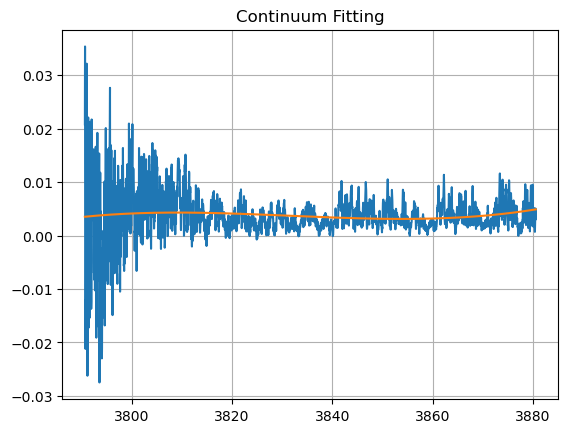

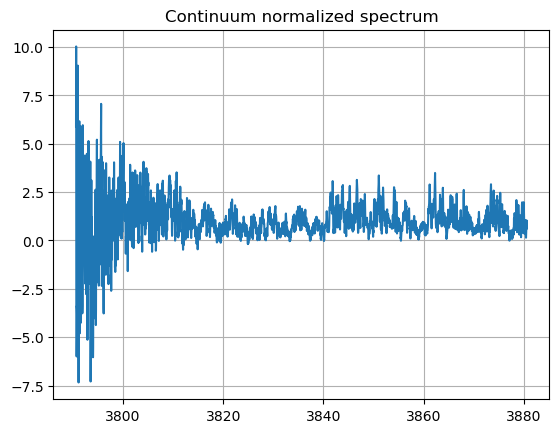

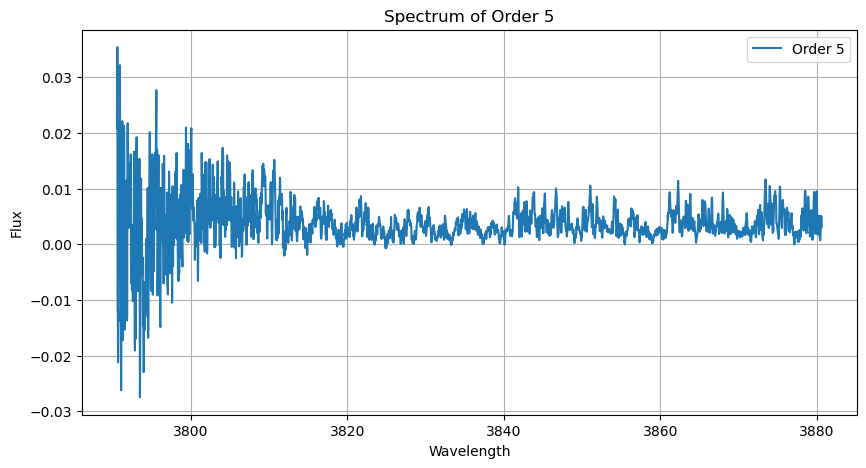

(3000,)
Order 6 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_6.dat


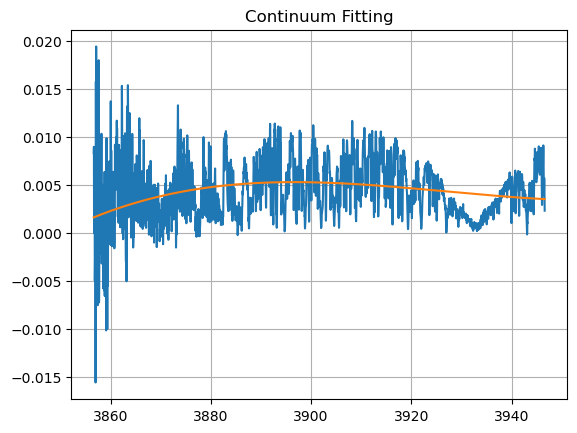

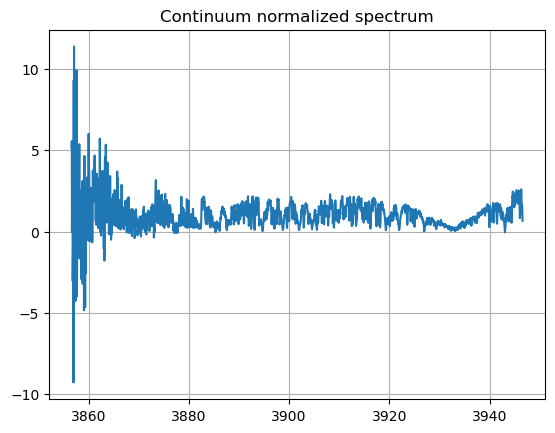

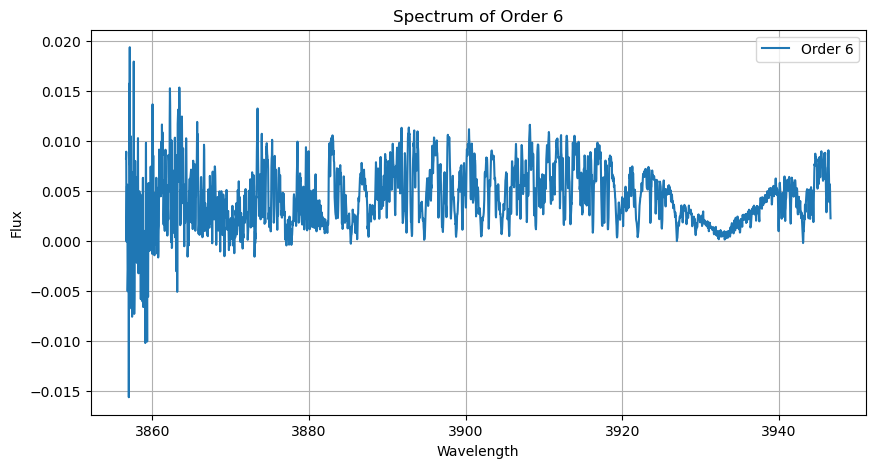

(3000,)
Order 7 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_7.dat


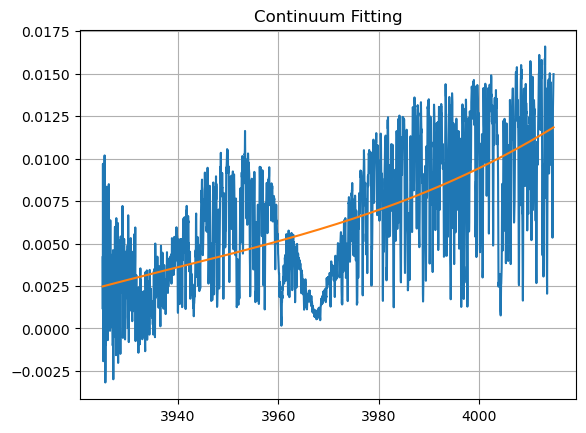

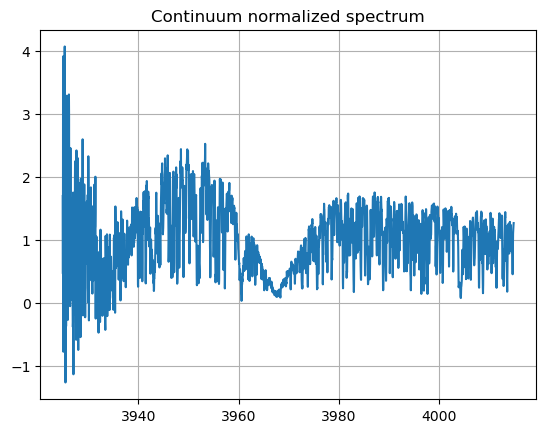

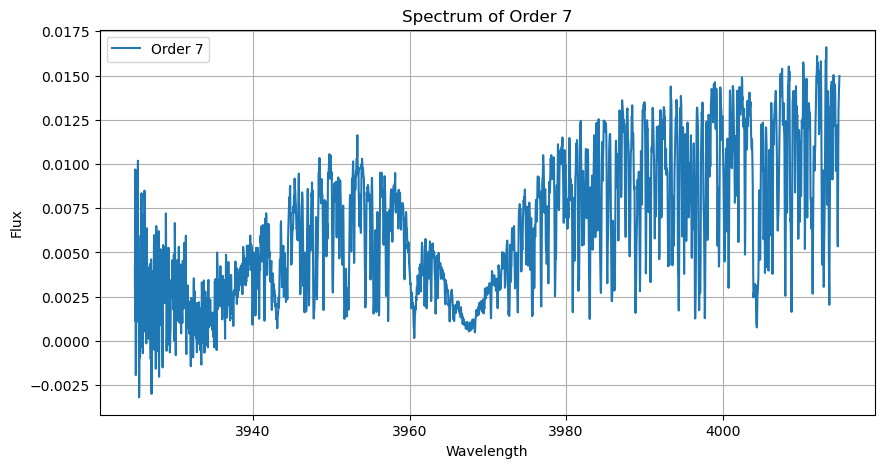

(3000,)
Order 8 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_8.dat


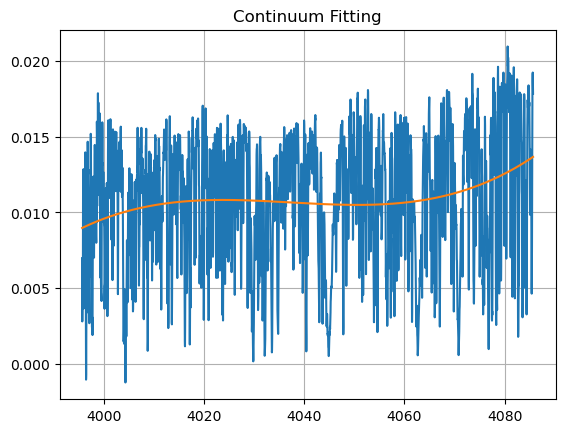

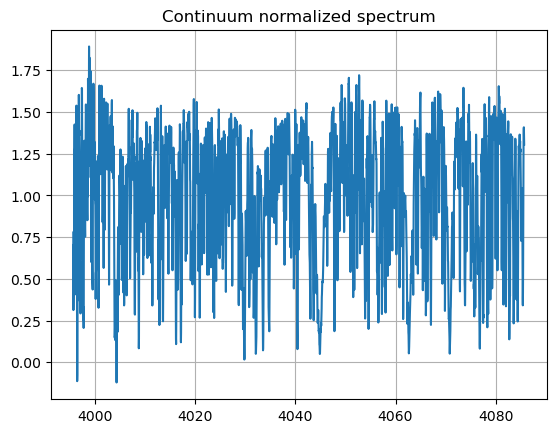

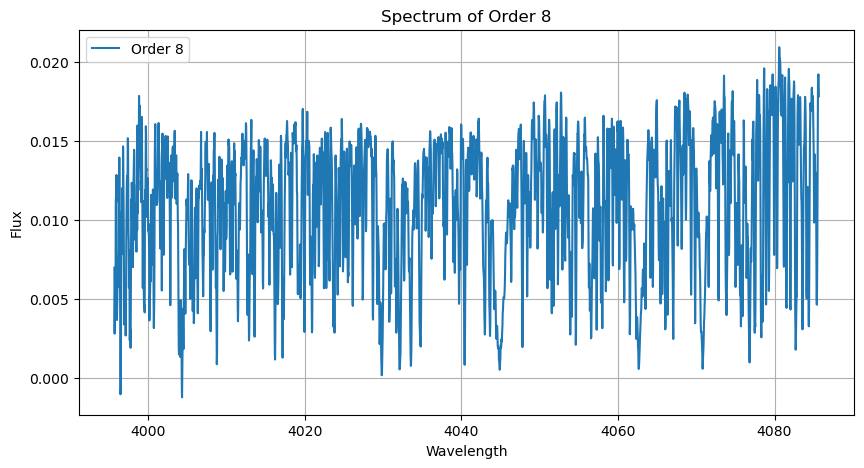

(3000,)
Order 9 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_9.dat


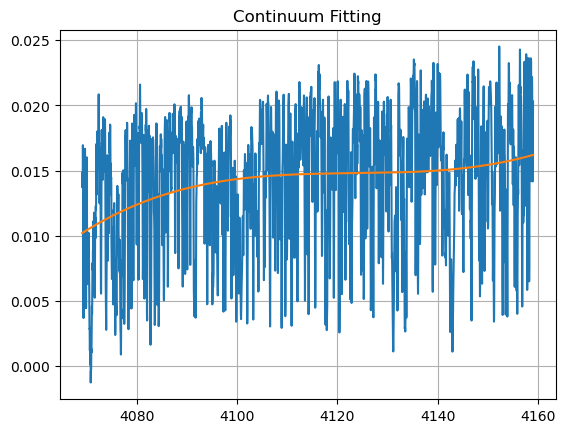

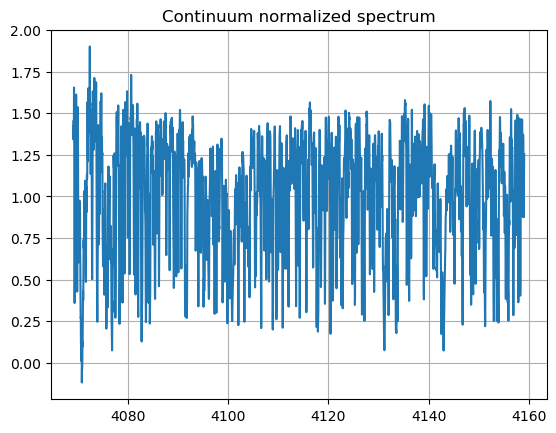

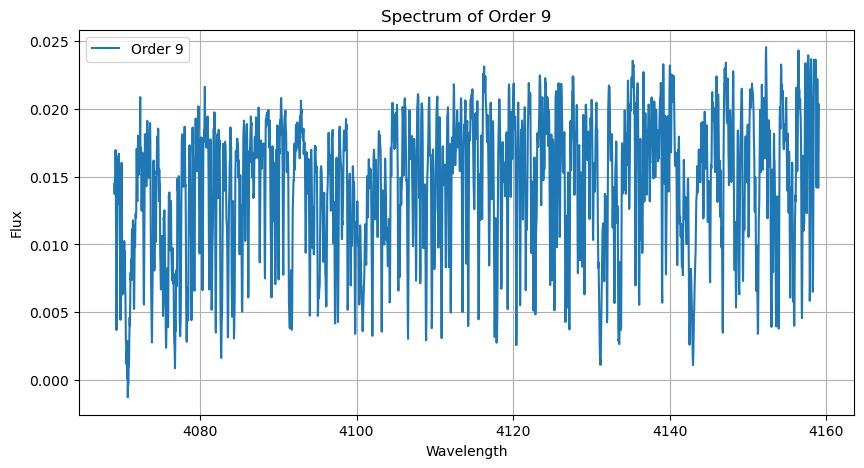

(3000,)
Order 10 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_10.dat


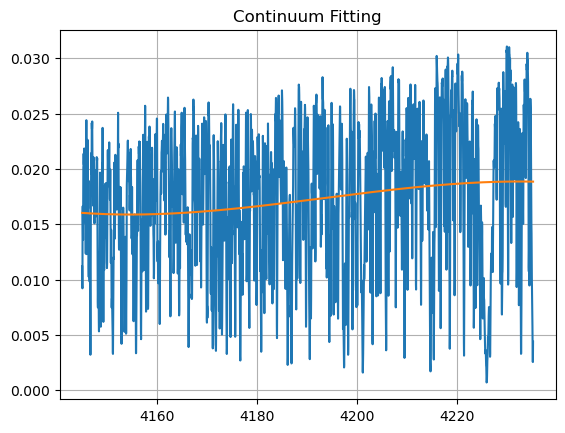

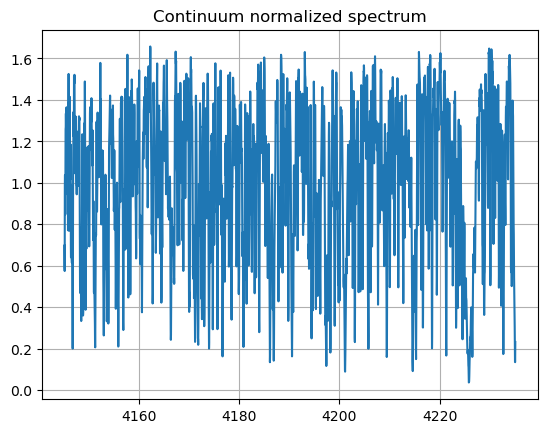

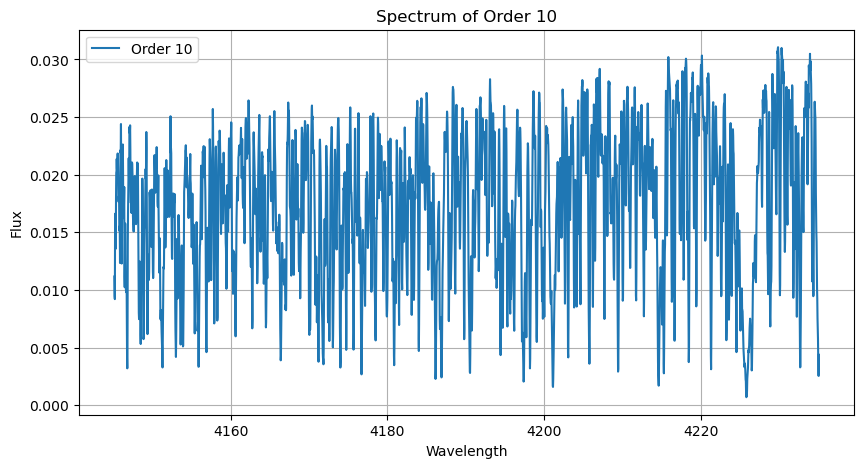

(3000,)
Order 11 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_11.dat


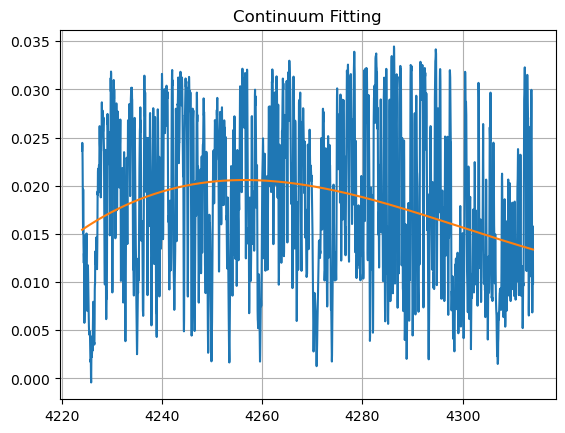

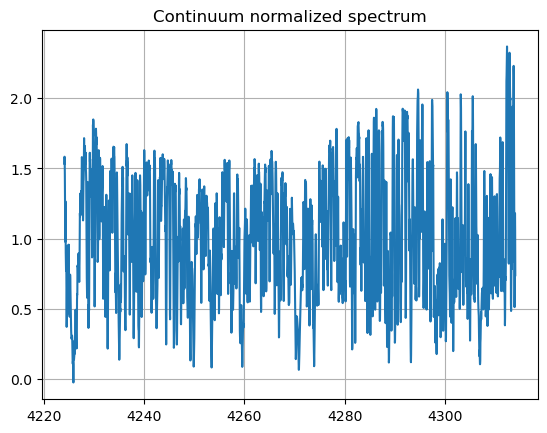

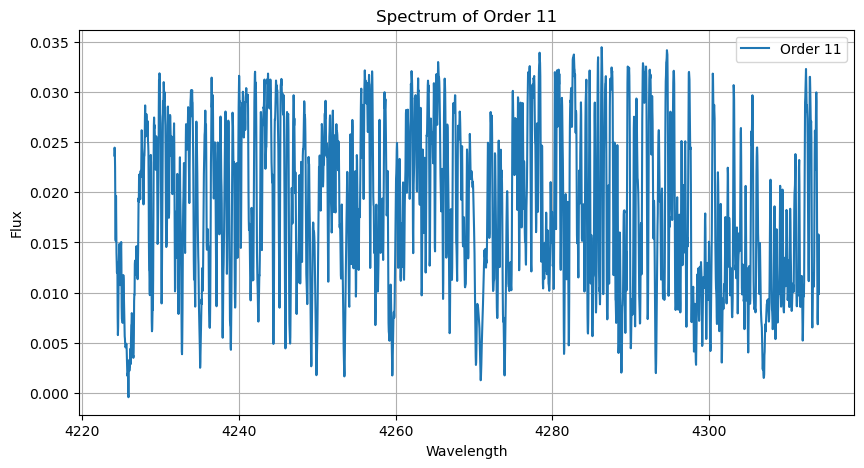

(3000,)
Order 12 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_12.dat


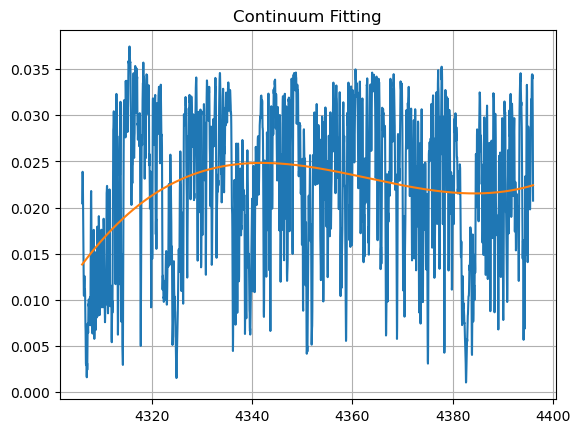

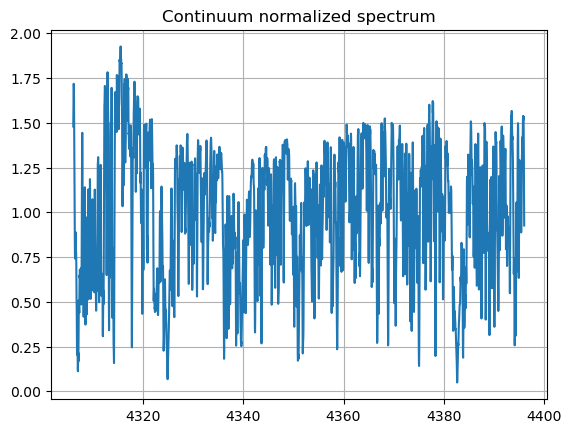

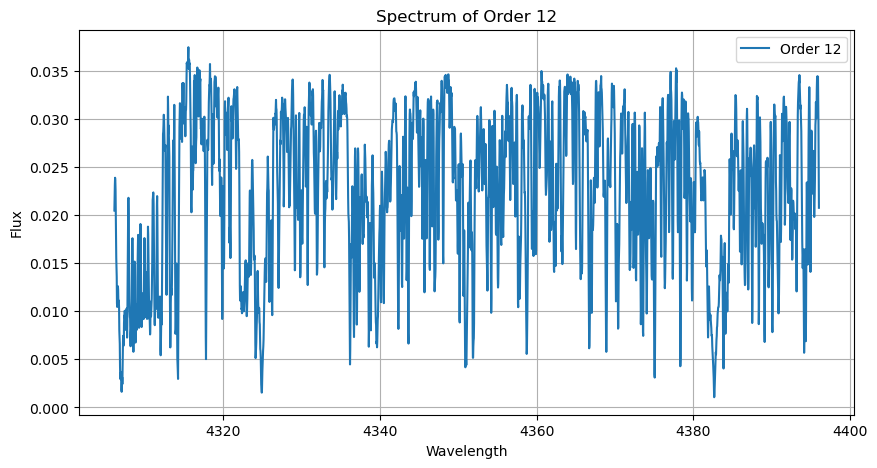

(3000,)
Order 13 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_13.dat


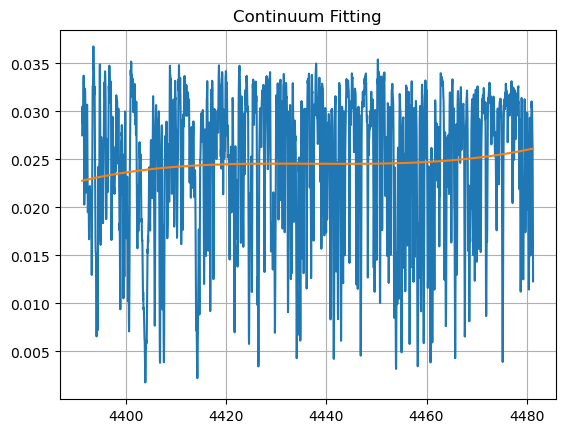

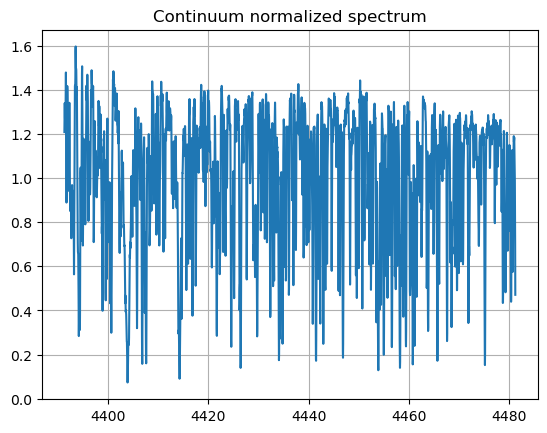

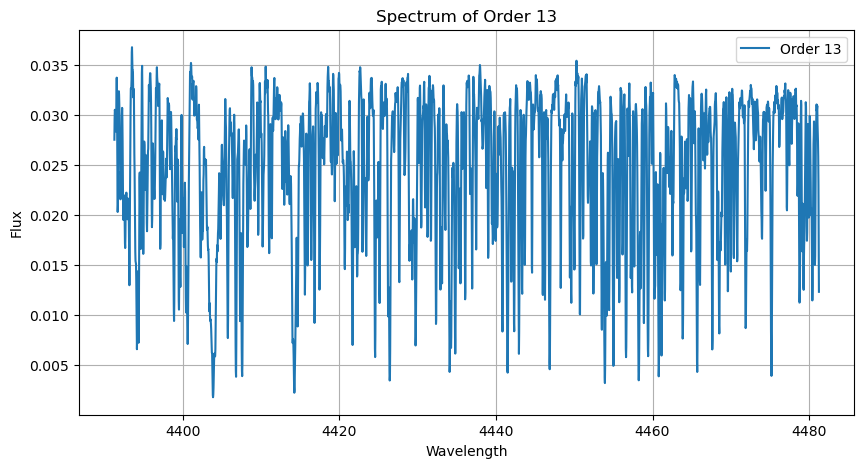

(3000,)
Order 14 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_14.dat


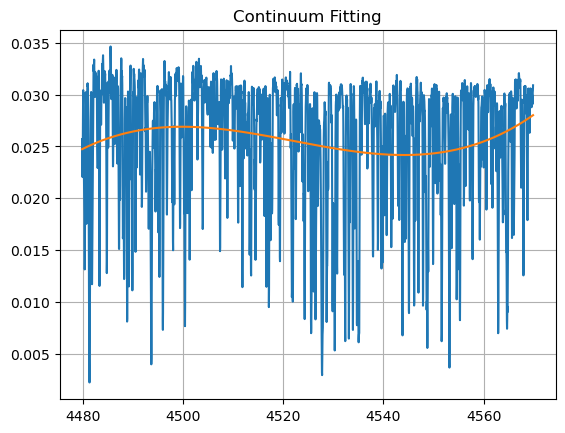

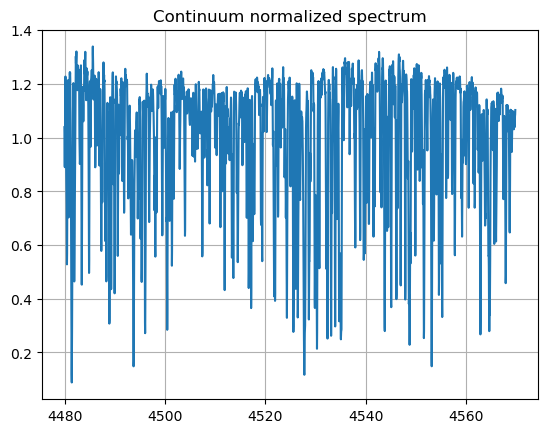

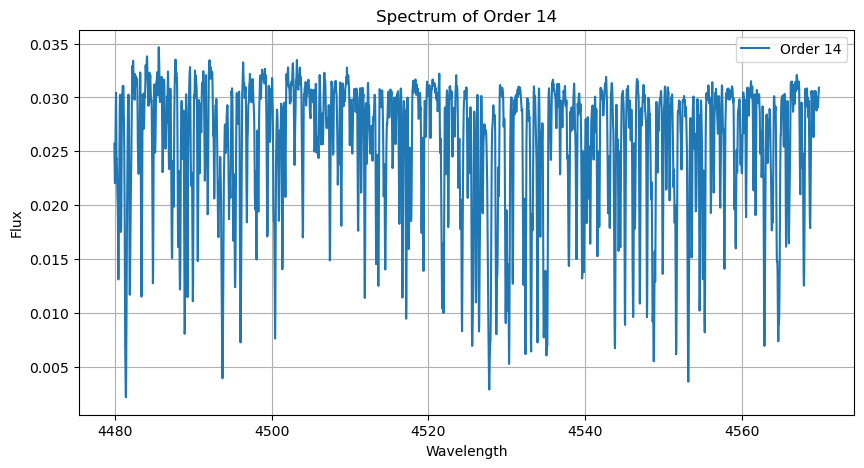

(3000,)
Order 15 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_15.dat


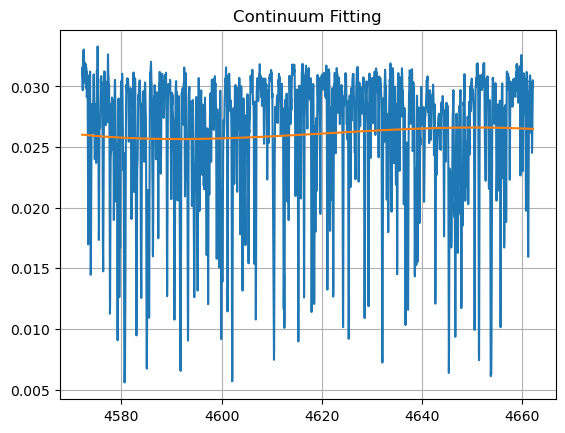

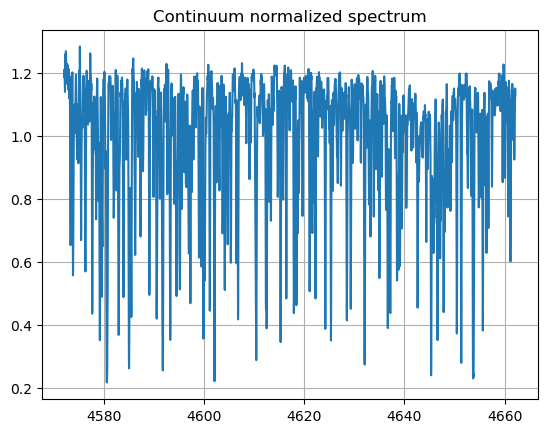

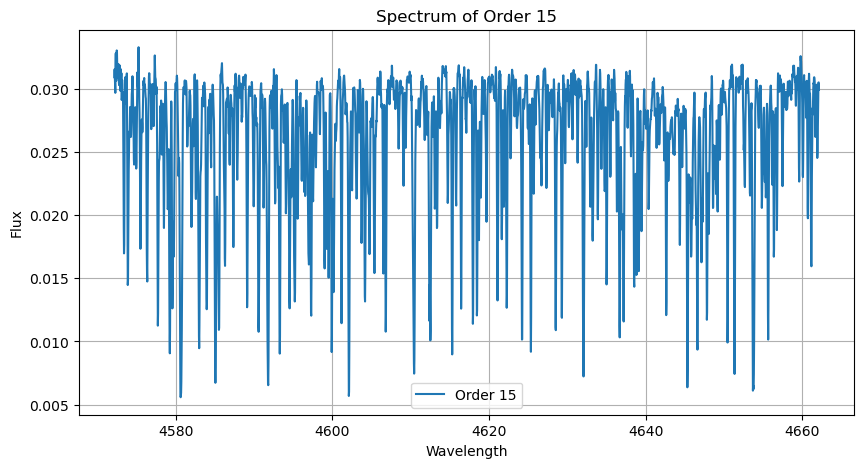

(3000,)
Order 16 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_16.dat


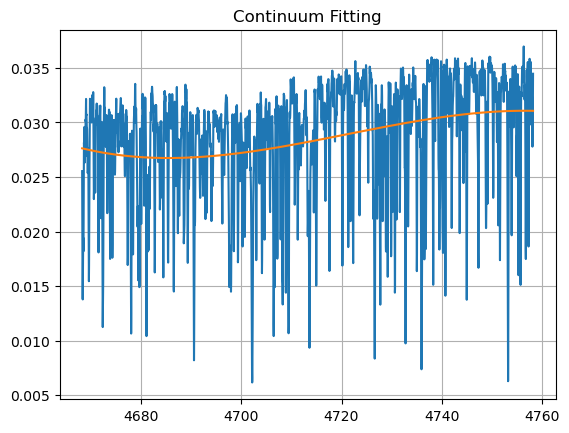

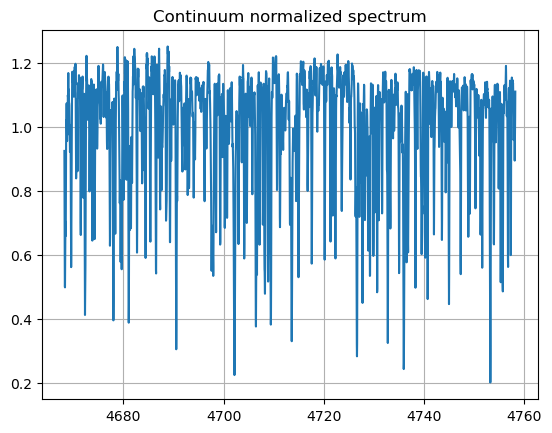

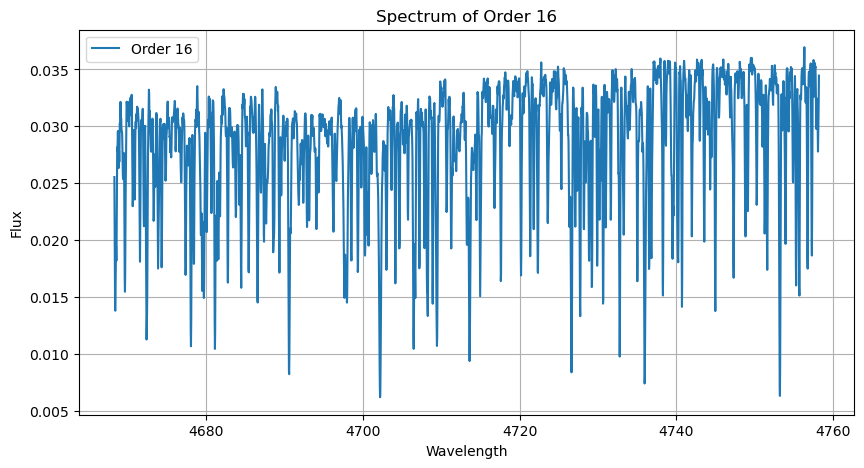

(3000,)
Order 17 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_17.dat


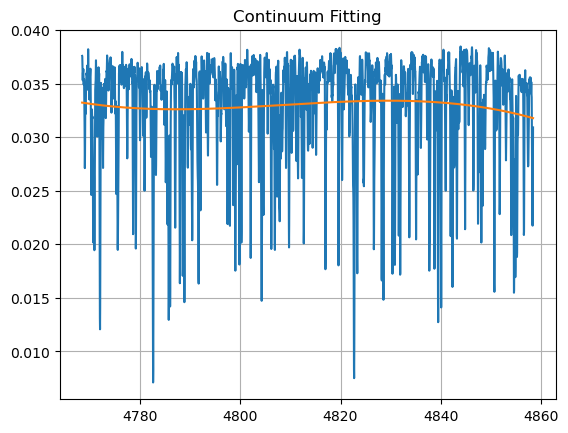

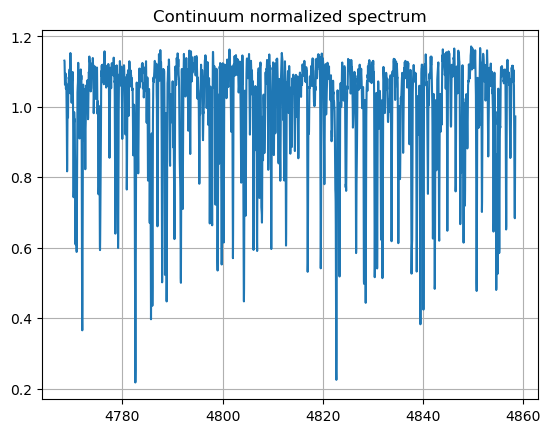

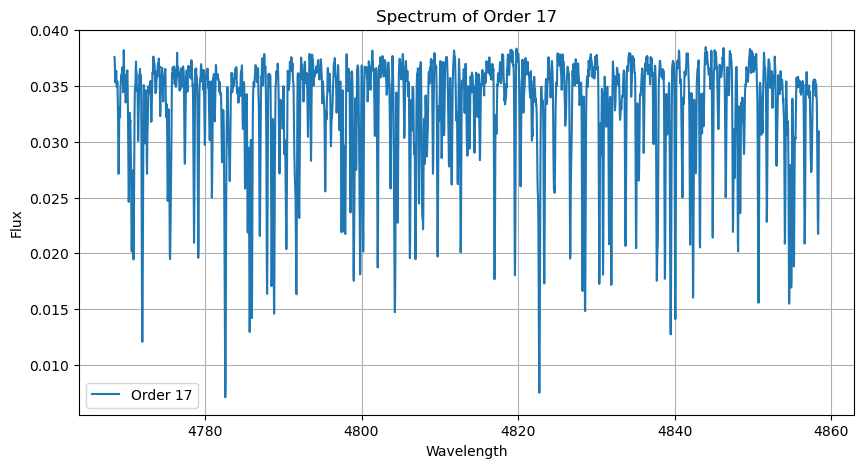

(3000,)
Order 18 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_18.dat


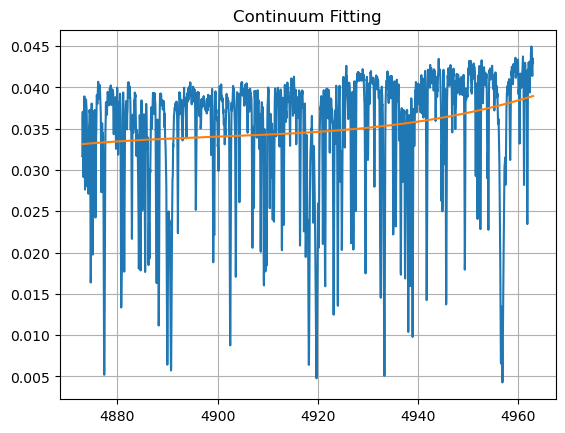

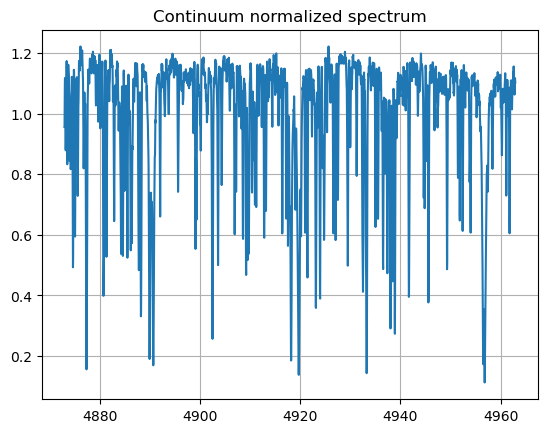

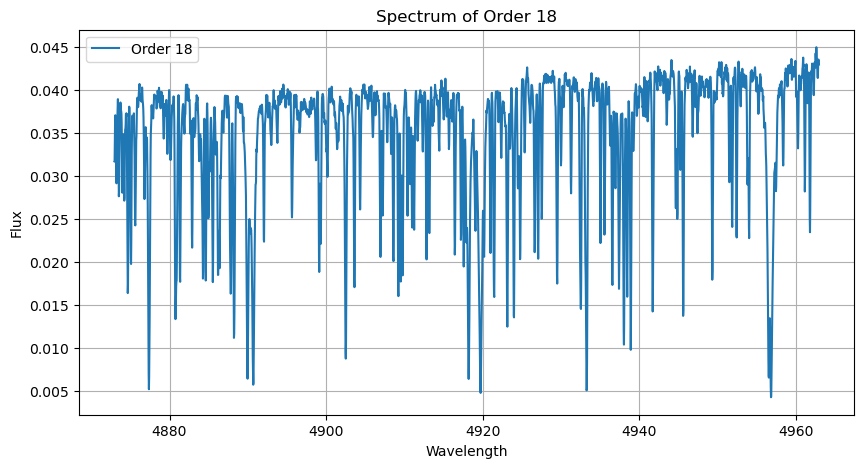

(3000,)
Order 19 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_19.dat


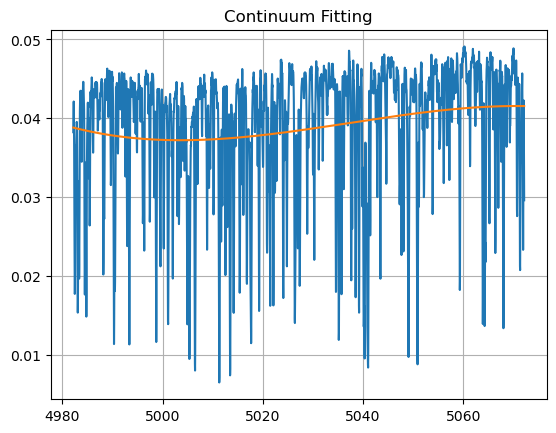

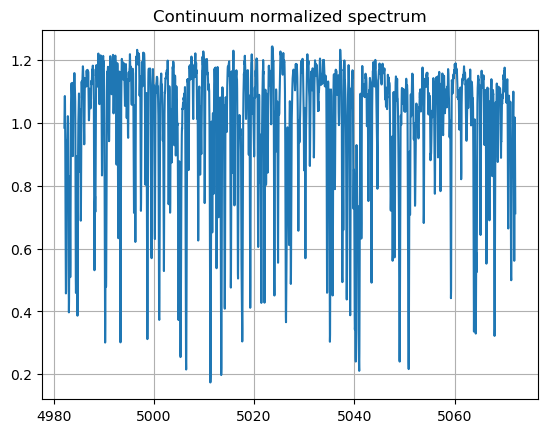

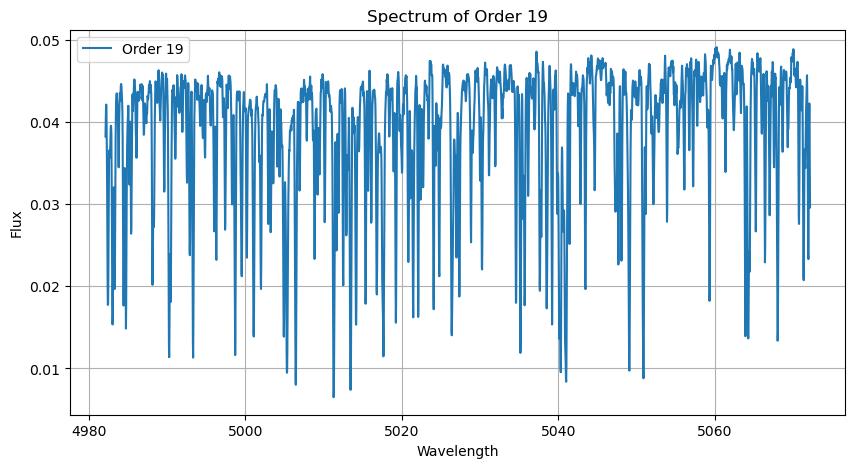

(3000,)
Order 20 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_20.dat


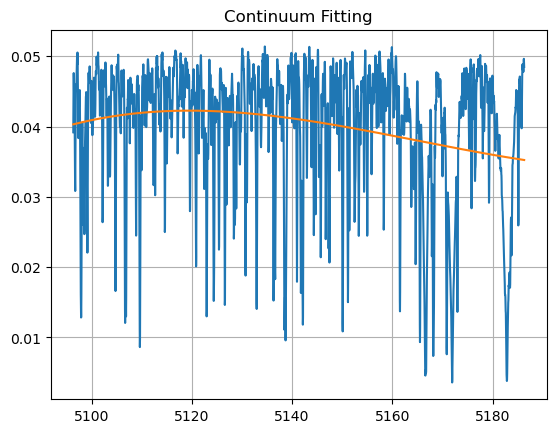

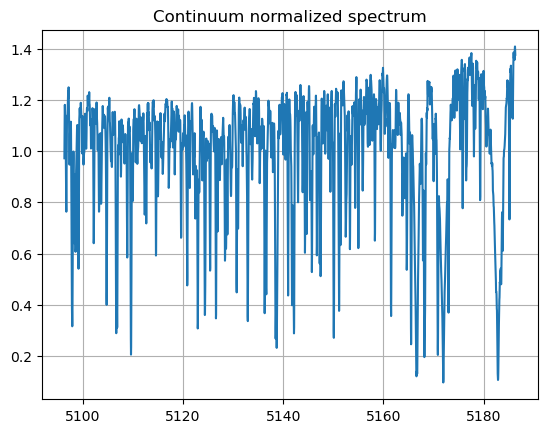

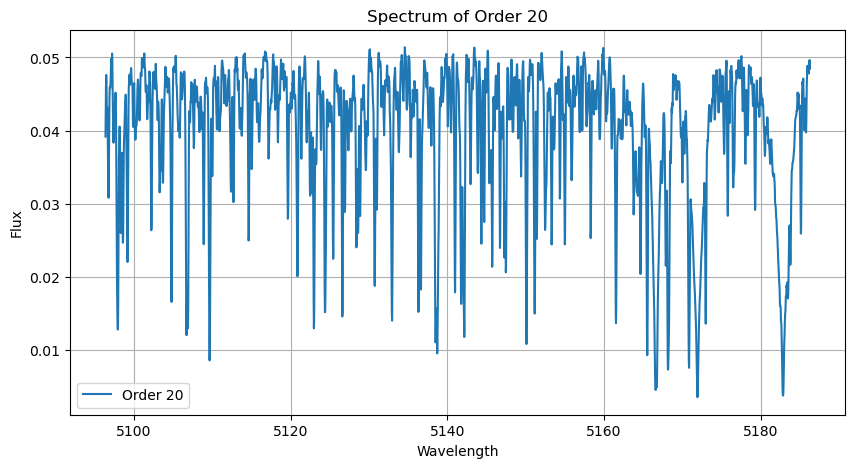

(3000,)
Order 21 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_21.dat


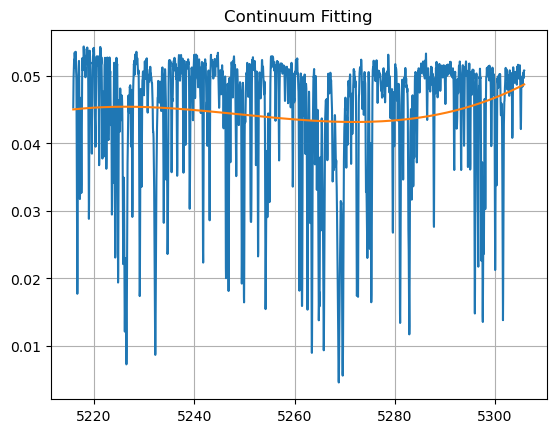

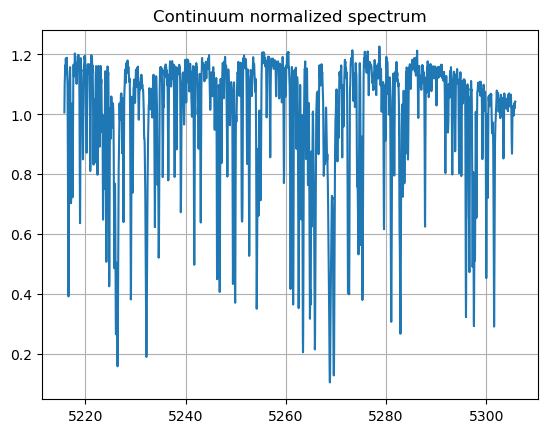

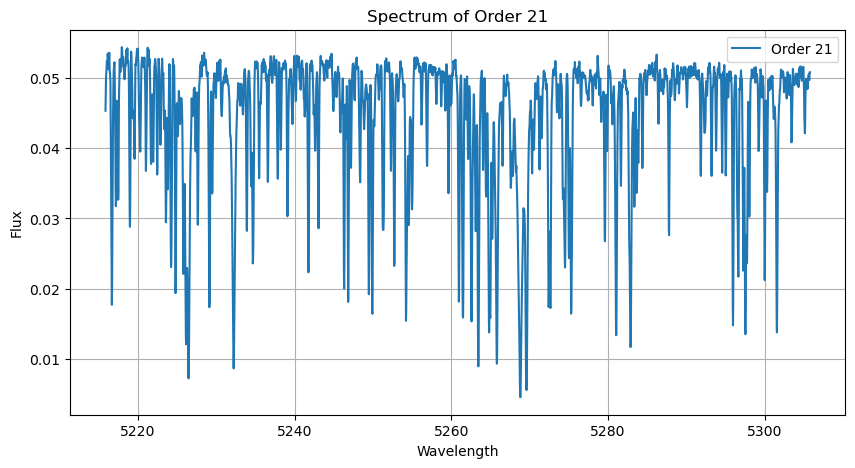

(3000,)
Order 22 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_22.dat


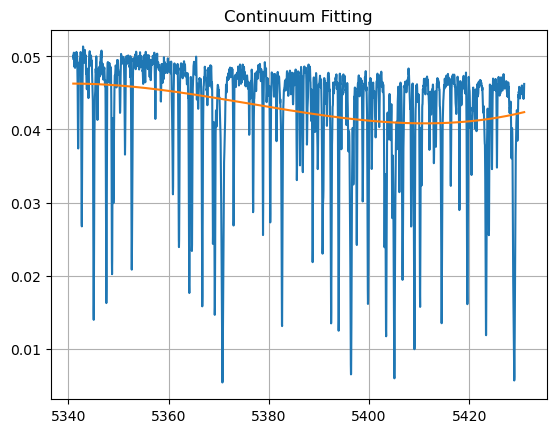

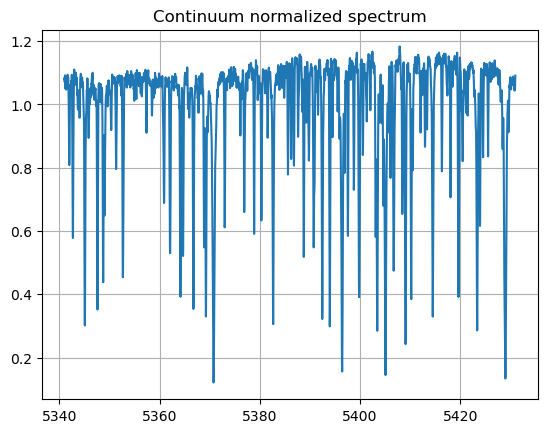

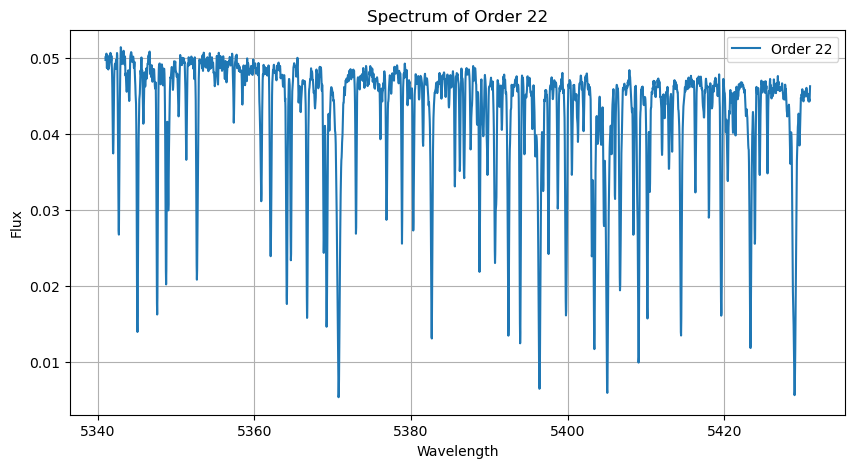

(3000,)
Order 23 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_23.dat


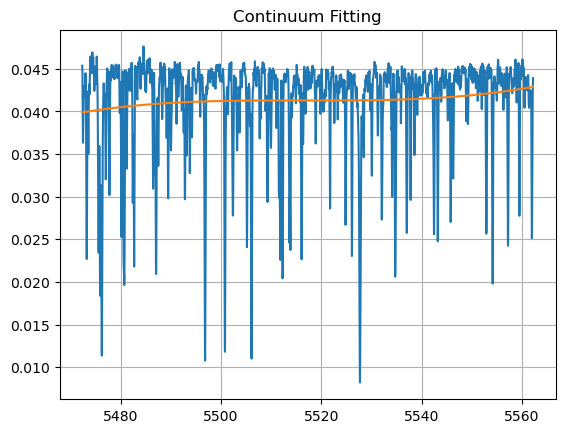

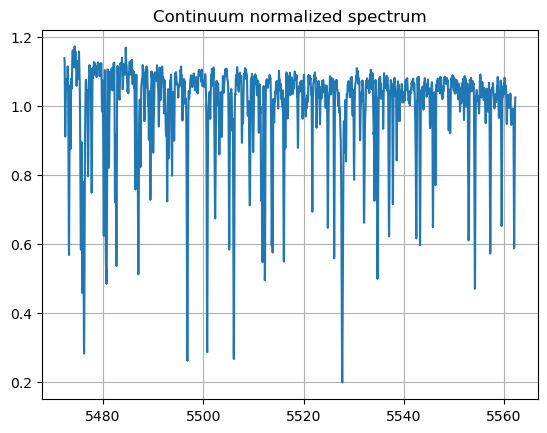

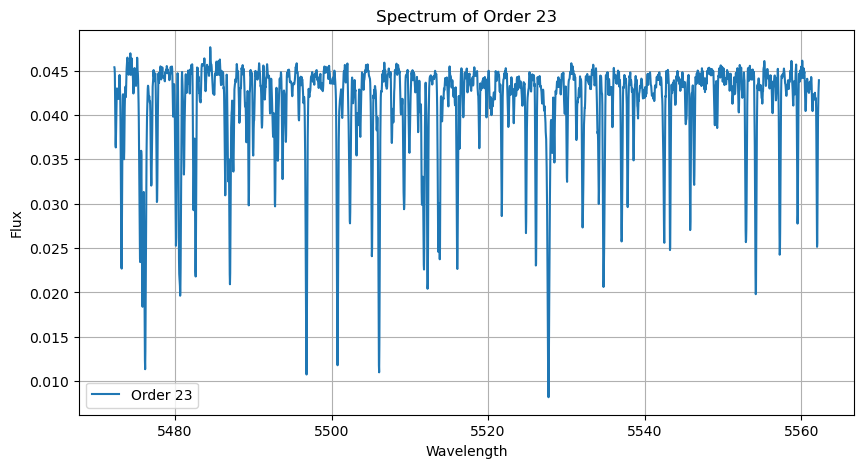

(3000,)
Order 24 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_24.dat


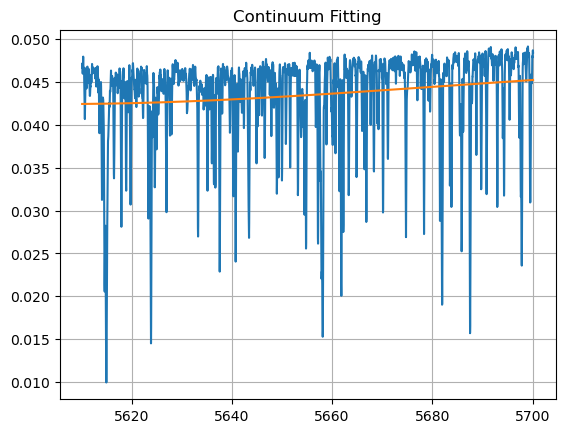

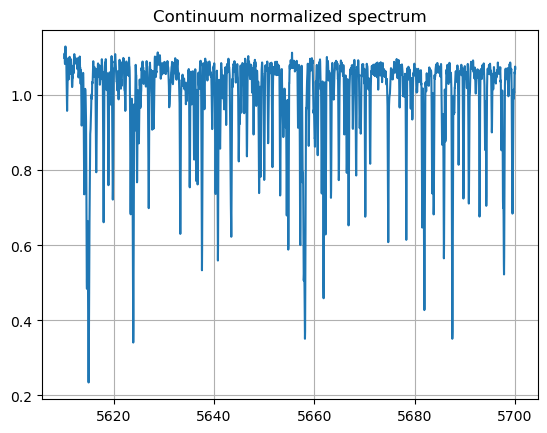

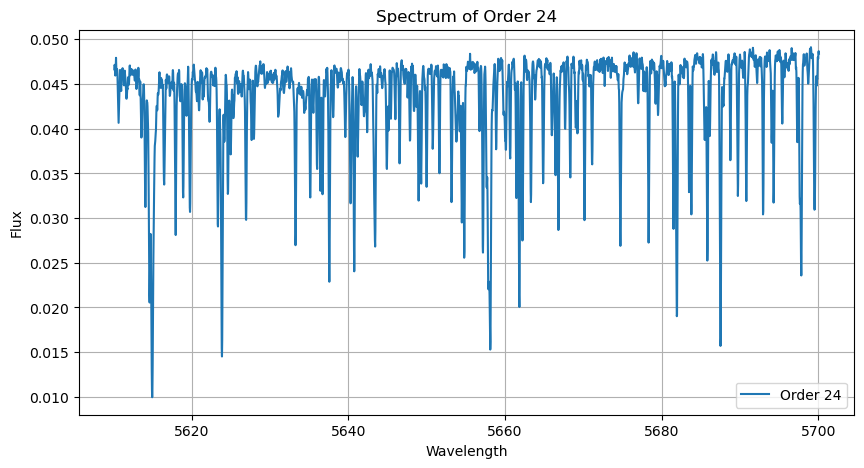

(3000,)
Order 25 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_25.dat


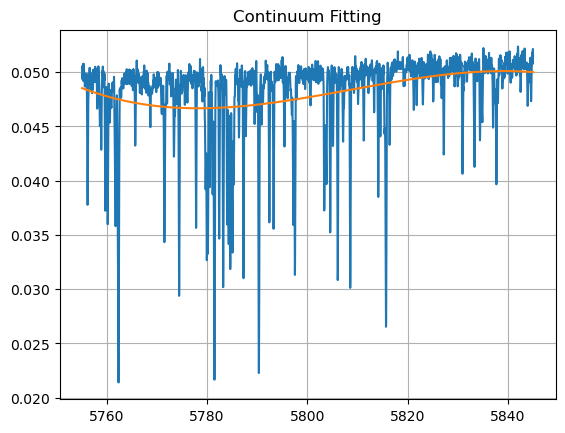

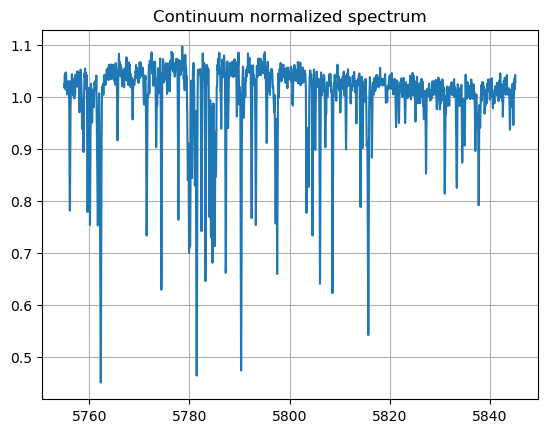

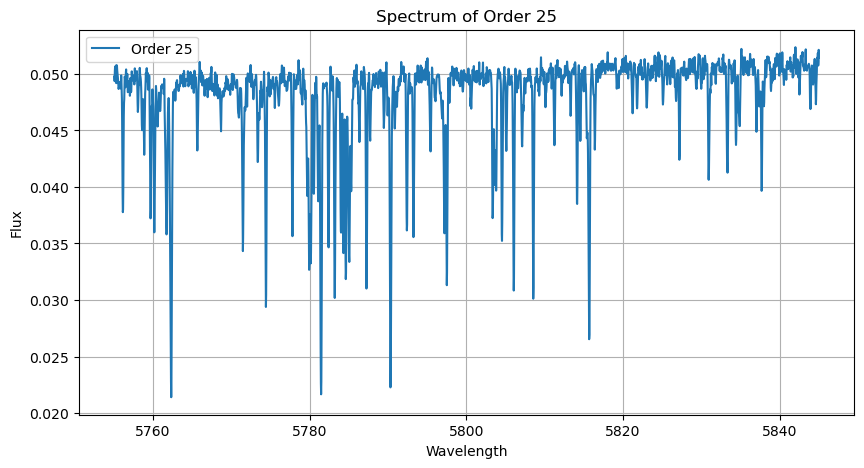

(3000,)
Order 26 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_26.dat


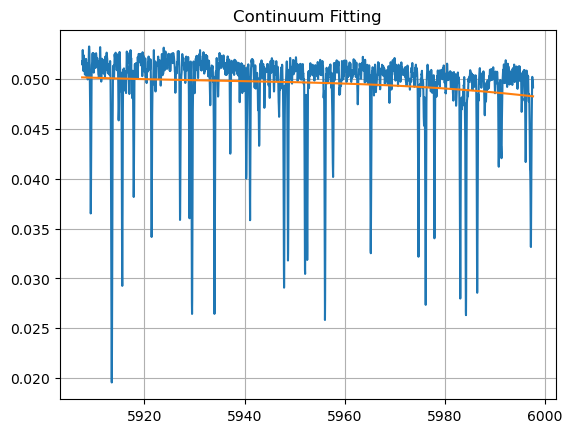

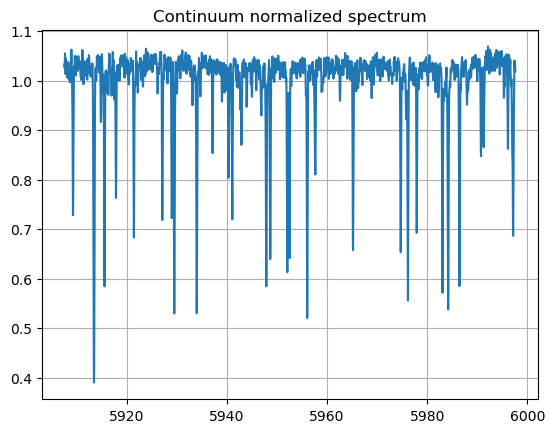

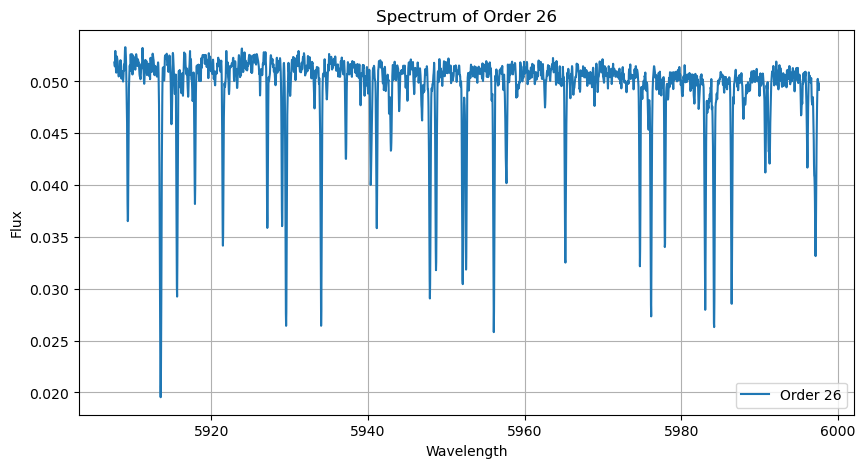

(3000,)
Order 27 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/order_27.dat


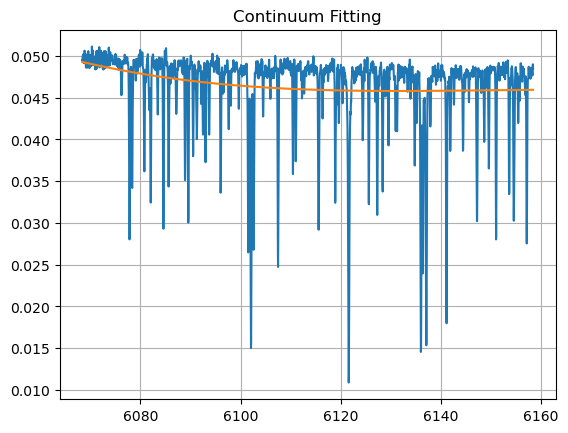

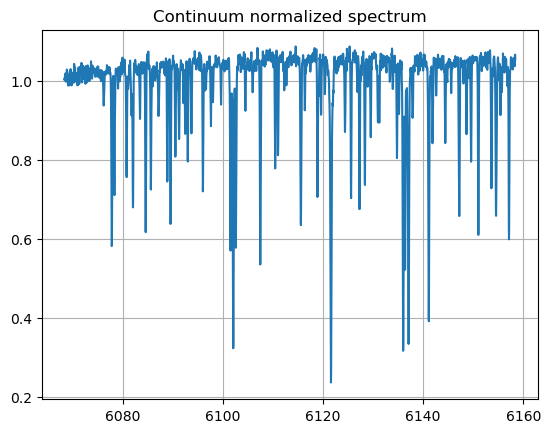

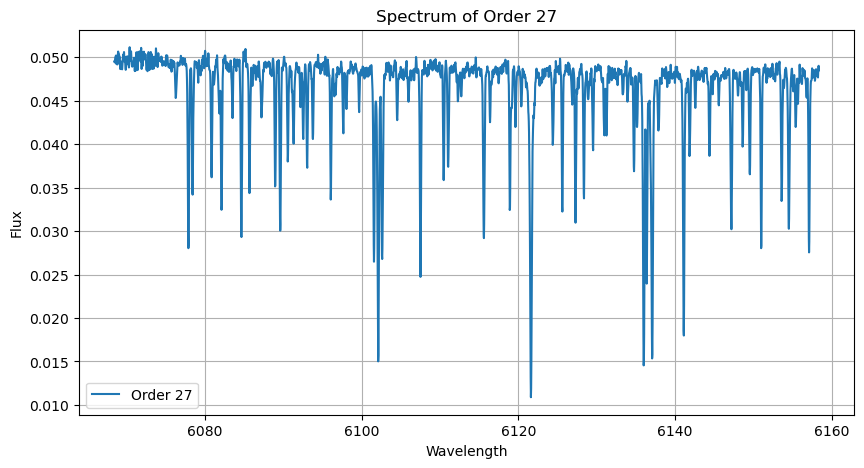

All orders saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/r.FEROS.2006-06-19T22:43:12.651.3081_all_orders.dat
Processing file: /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/r.FEROS.2012-05-12T01:51:55.995.3081.fits


XTENSION= 'IMAGE   '           / FITS Image Extension                           
BITPIX  =                  -32 / No. of bits per pixel                          
NAXIS   =                    1 / No. of axes in image                           
NAXIS1  =                 4461 / No. of pixels                                  
PCOUNT  =                    0 / Parameter count always 0                       
GCOUNT  =                    1 / Group count always 1                           
                                                                                
CRPIX1  =                 -49. / Reference pixel                                
CRVAL1  =              3525.72 / Coordinate at reference pixel                  
CDELT1  =                 0.03 / Coord. incr. per pixel (original value)        
CTYPE1  = 'WAVELENGTH      '   / Units of coordinate                            
BUNIT   = 'FLUX            '   / Units of data values                           
DATAMAX =       0.2011160403

(3000,)
Order 5 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_5.dat


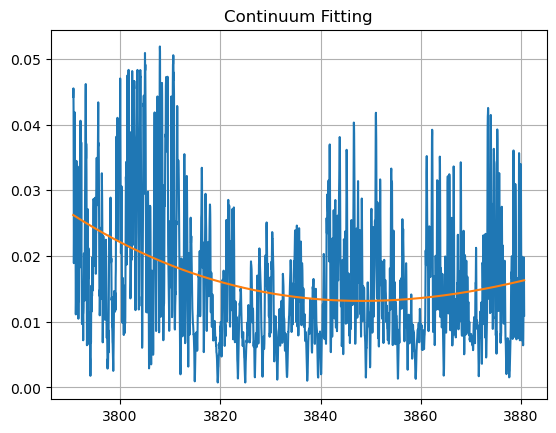

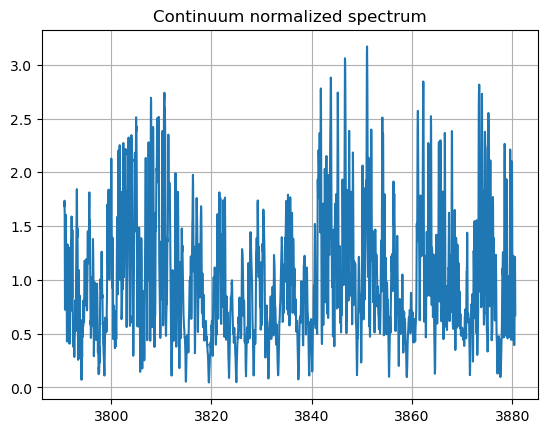

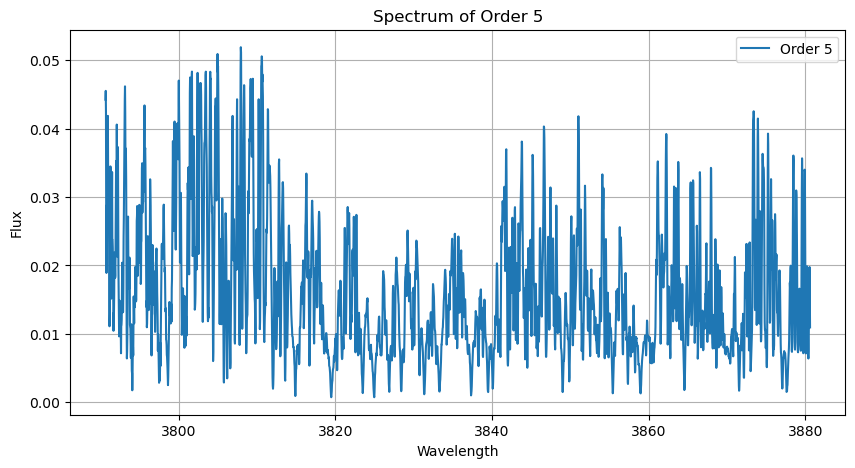

(3000,)
Order 6 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_6.dat


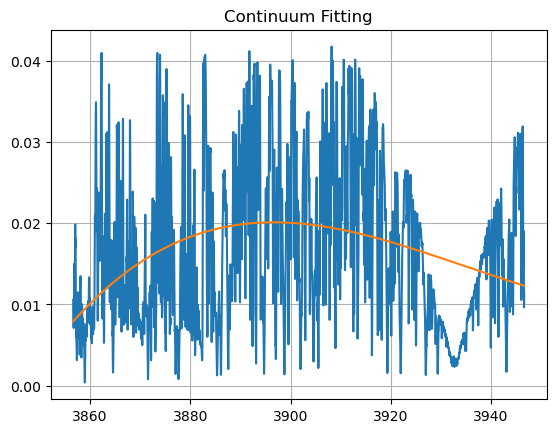

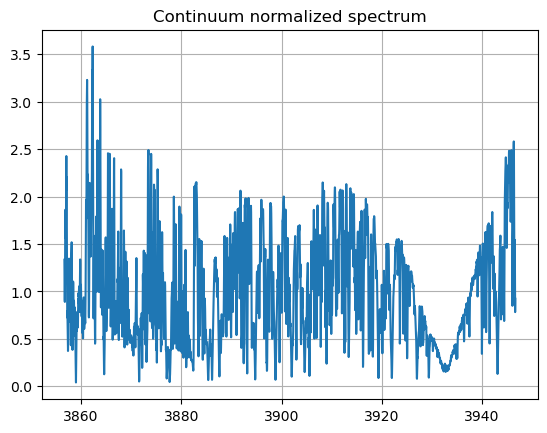

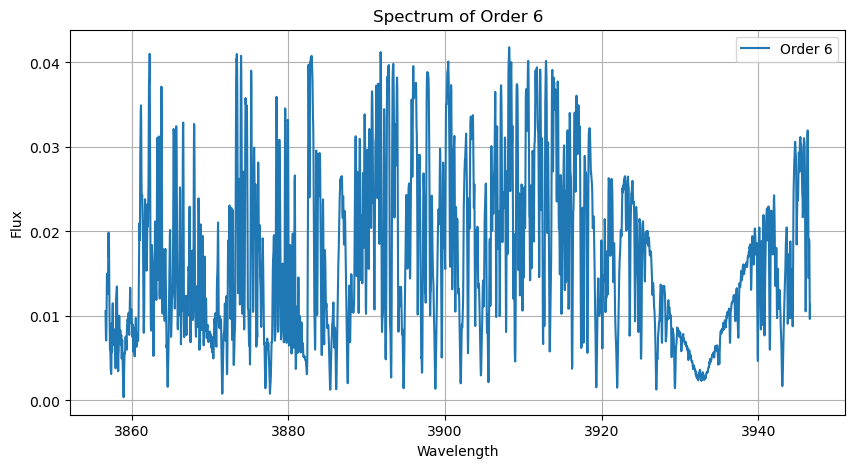

(3000,)
Order 7 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_7.dat


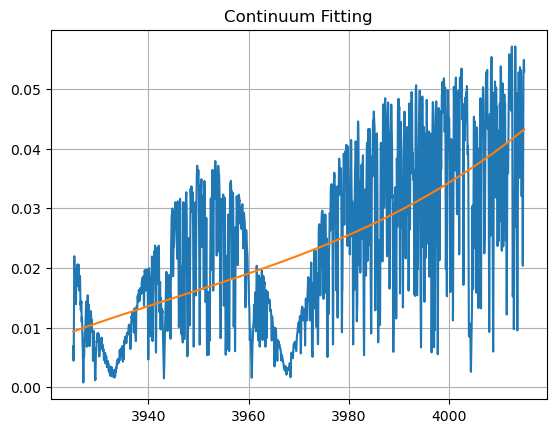

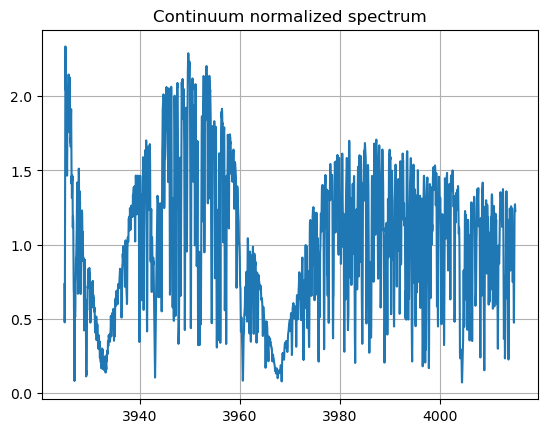

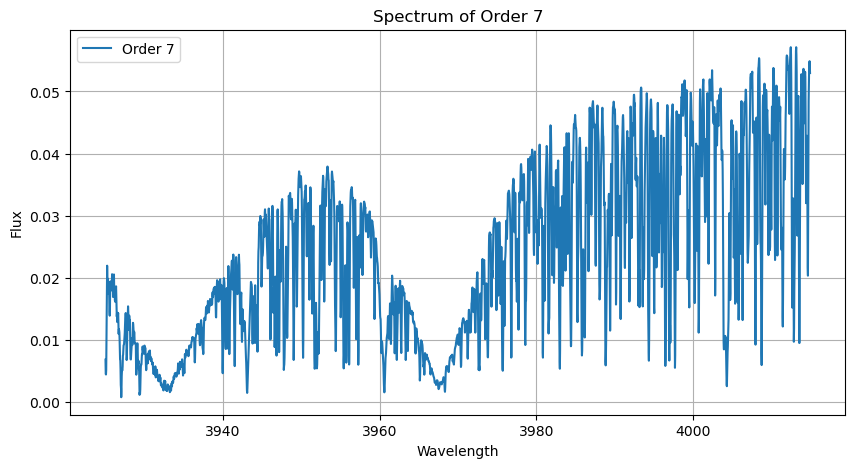

(3000,)
Order 8 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_8.dat


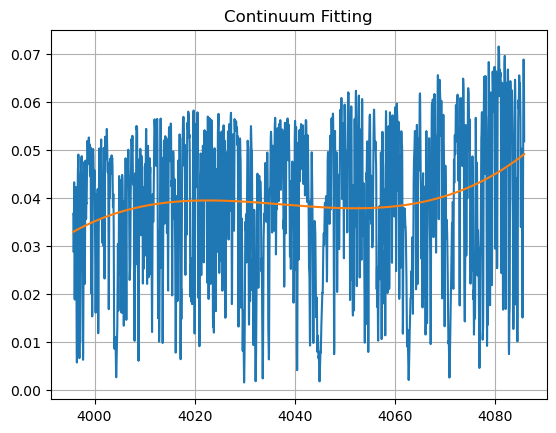

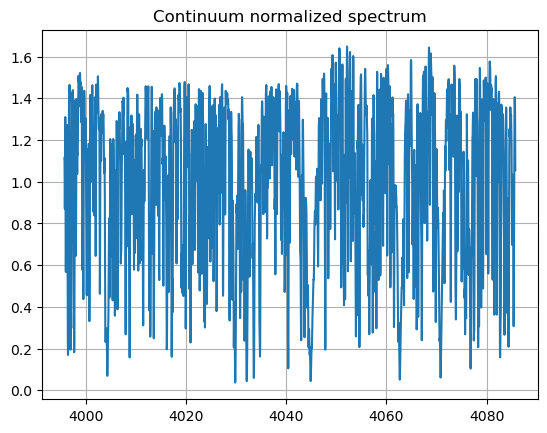

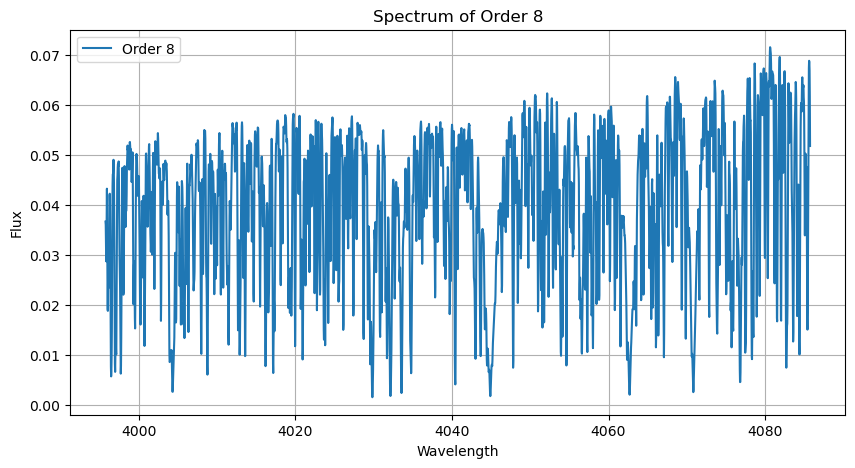

(3000,)
Order 9 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_9.dat


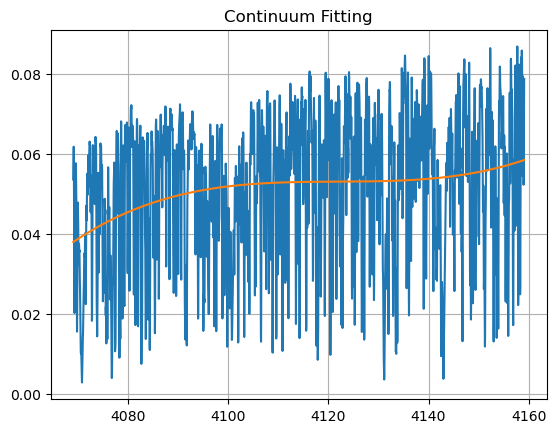

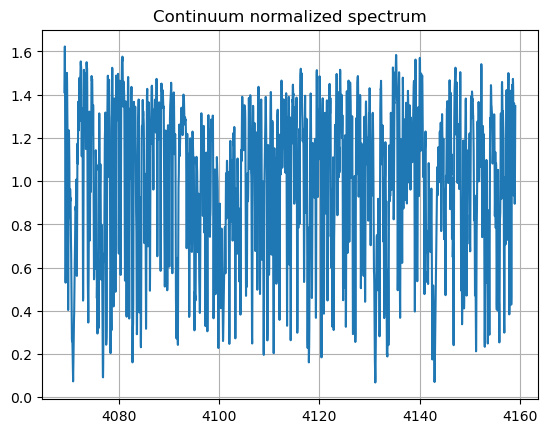

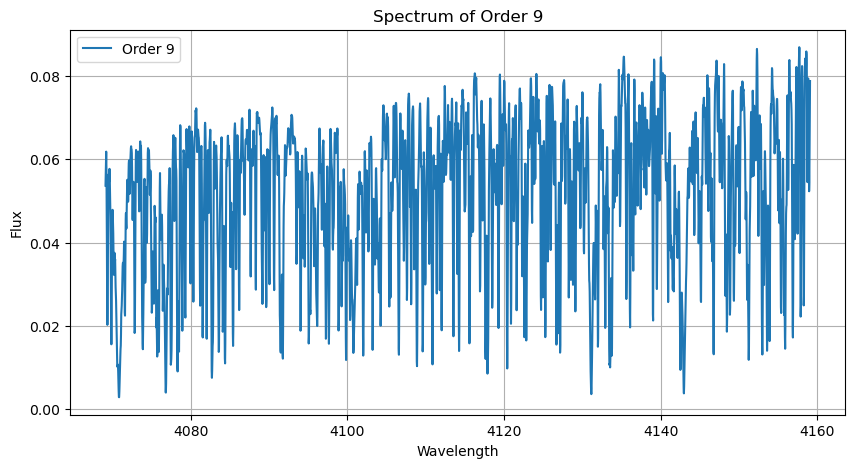

(3000,)
Order 10 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_10.dat


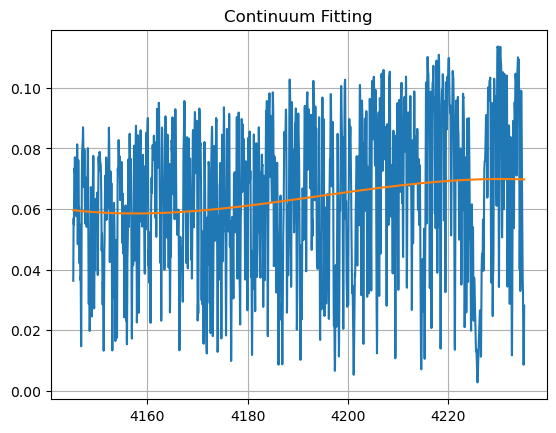

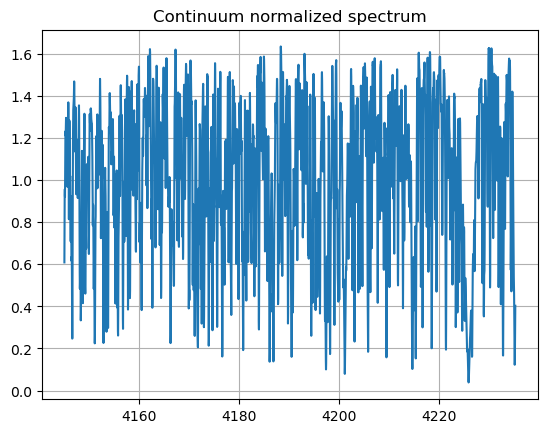

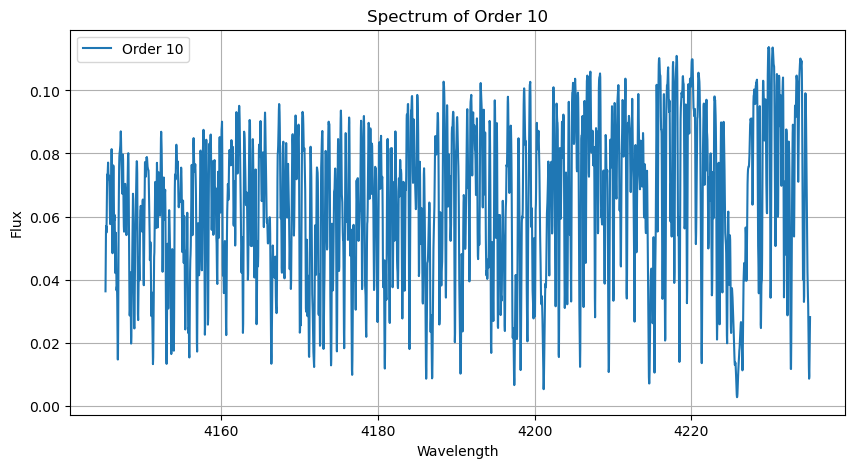

(3000,)
Order 11 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_11.dat


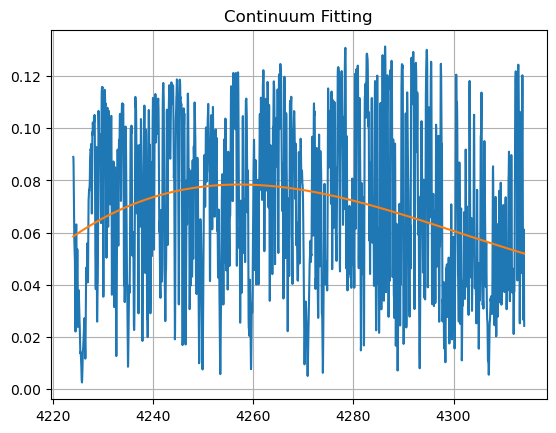

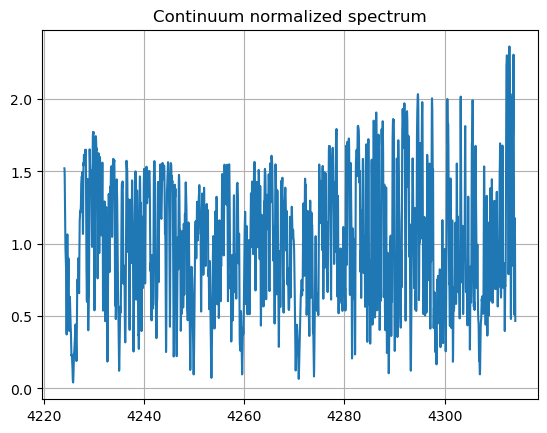

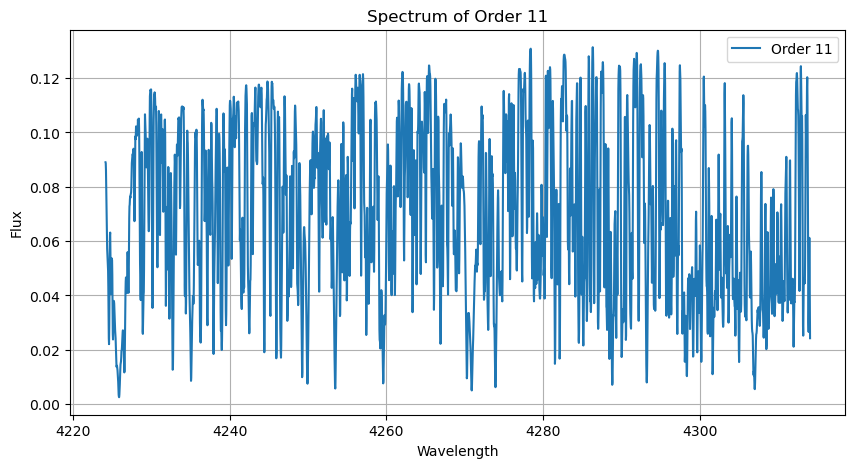

(3000,)
Order 12 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_12.dat


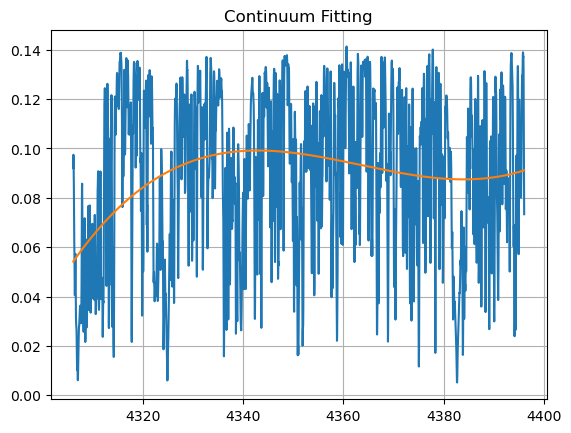

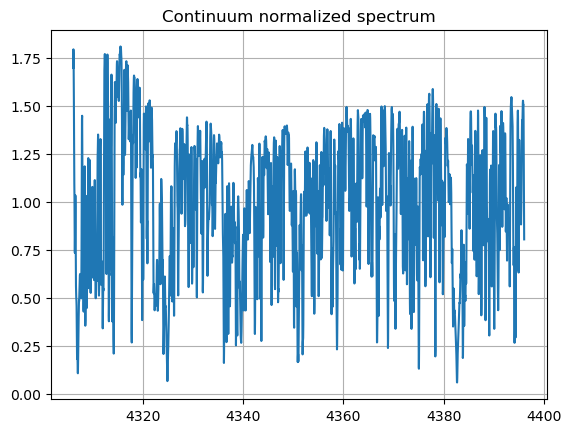

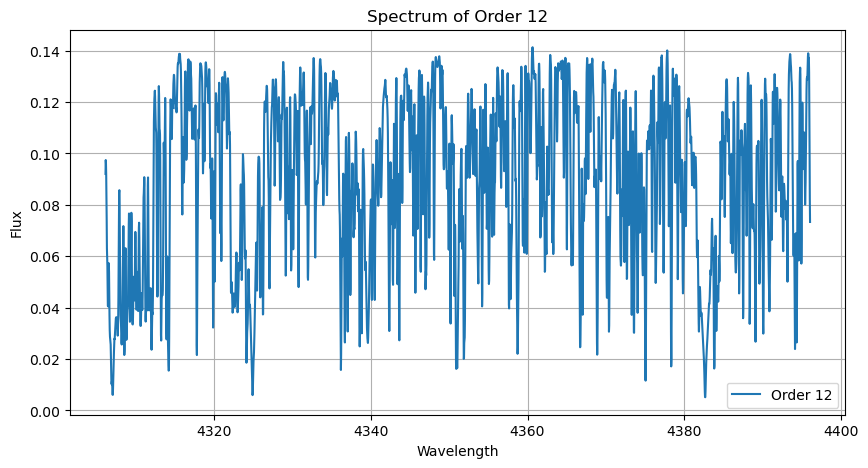

(3000,)
Order 13 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_13.dat


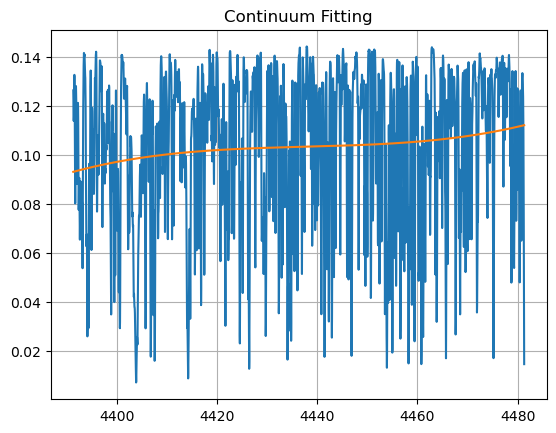

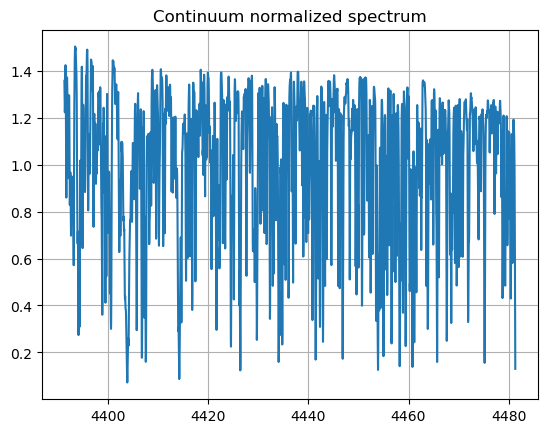

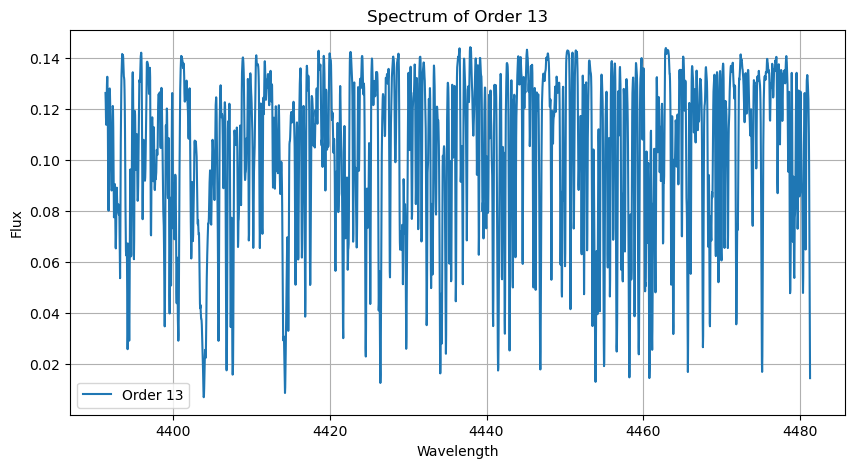

(3000,)
Order 14 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_14.dat


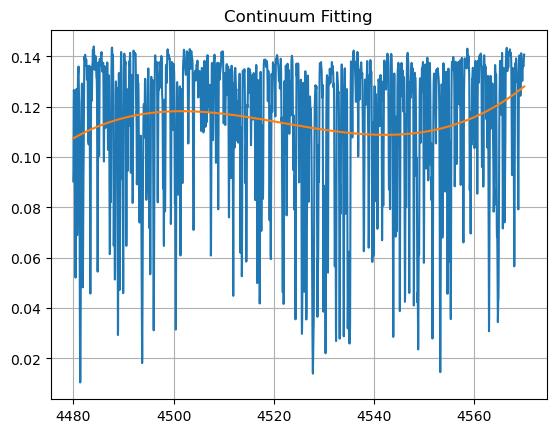

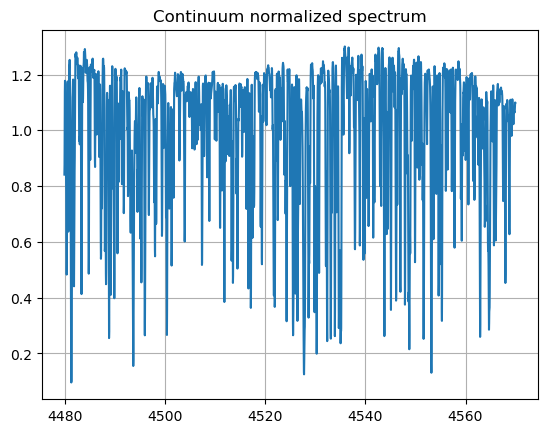

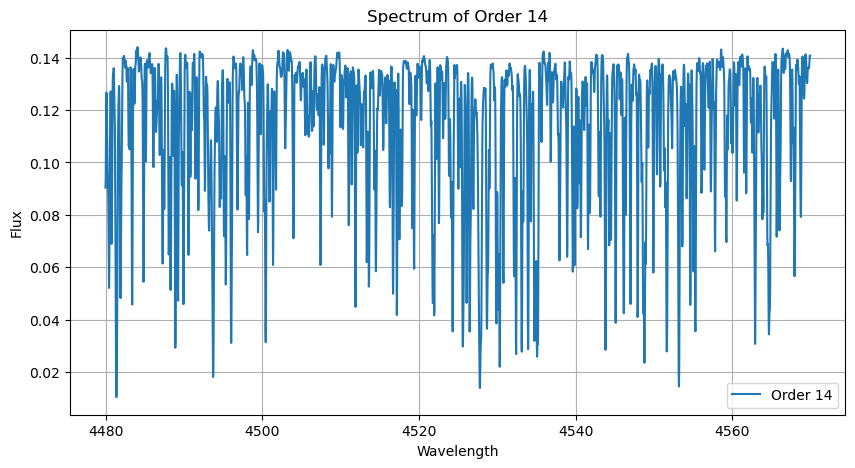

(3000,)
Order 15 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_15.dat


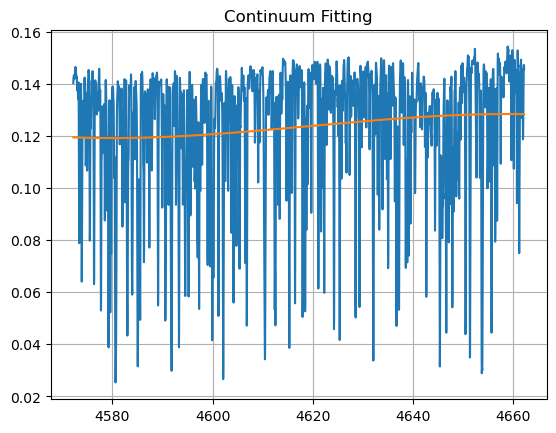

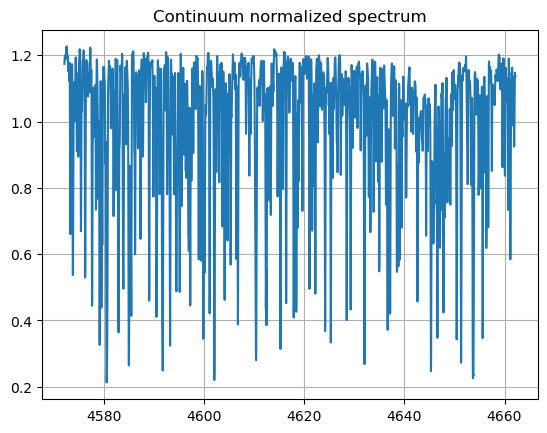

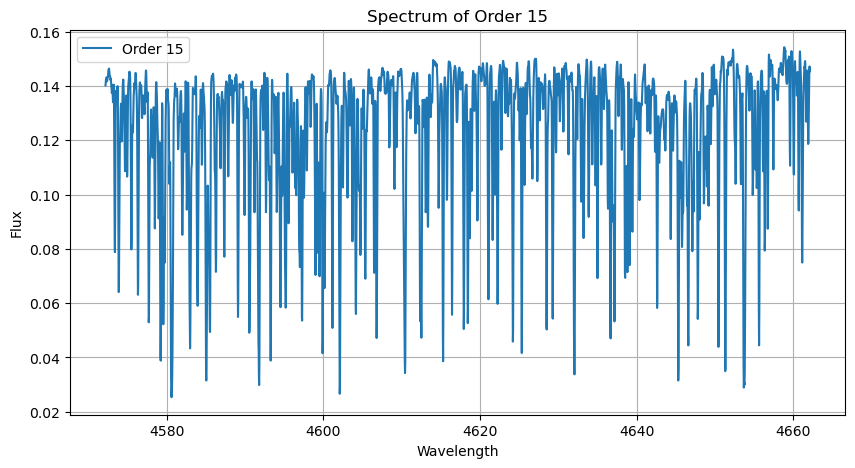

(3000,)
Order 16 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_16.dat


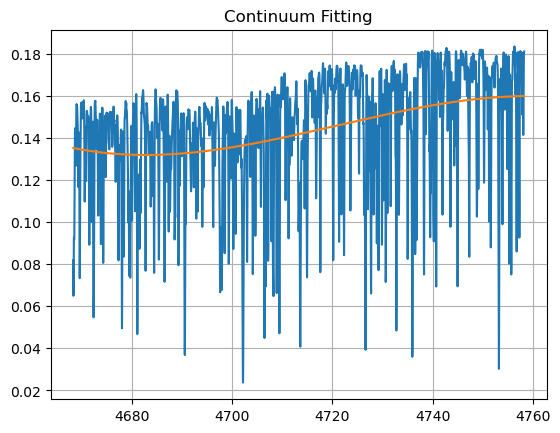

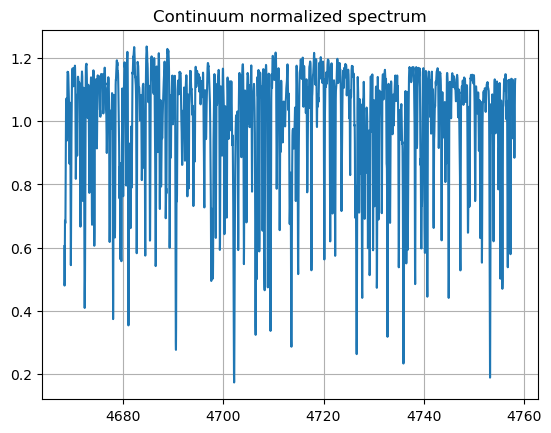

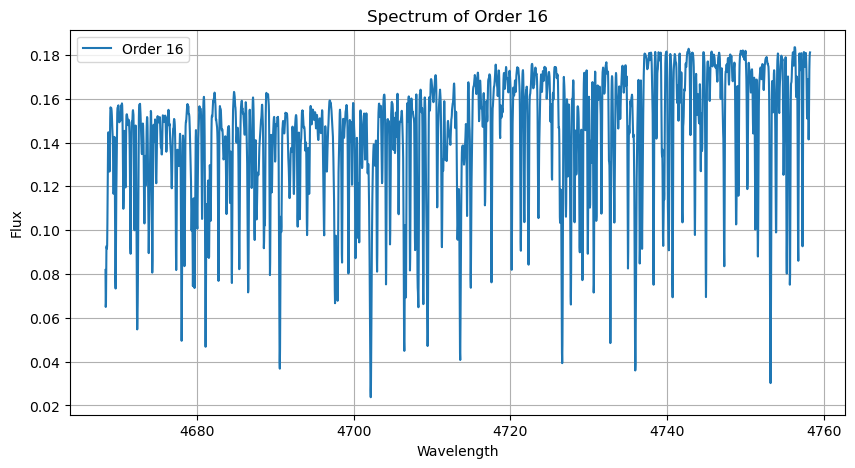

(3000,)
Order 17 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_17.dat


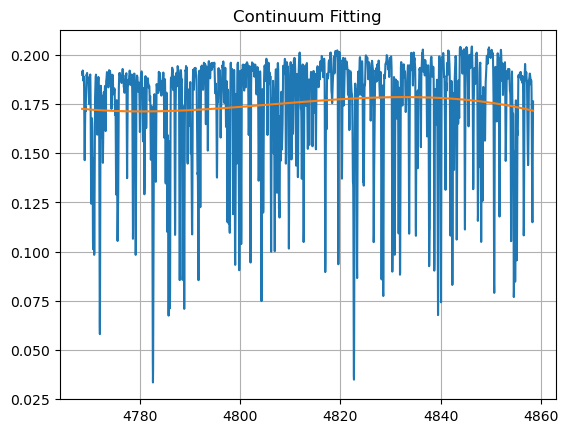

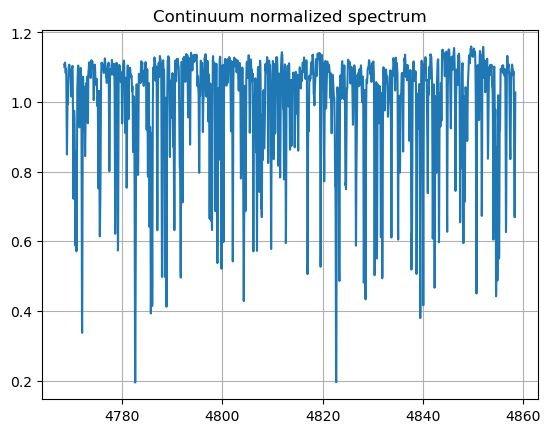

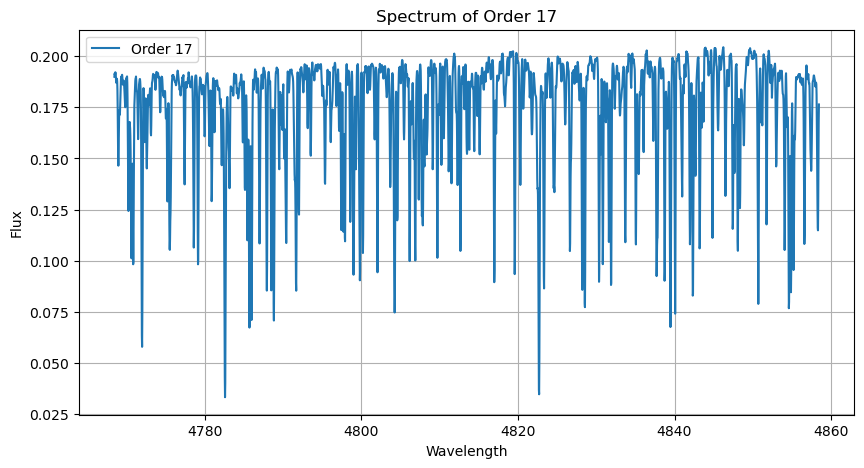

(3000,)
Order 18 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_18.dat


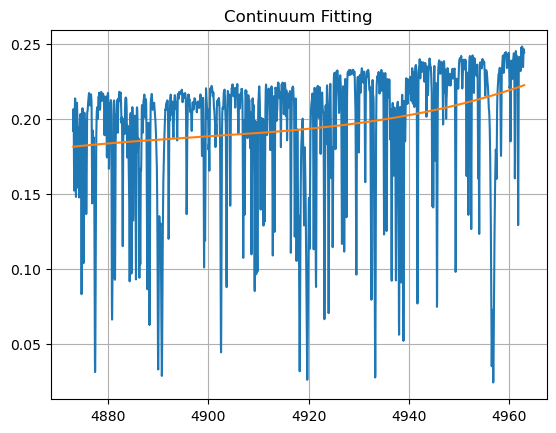

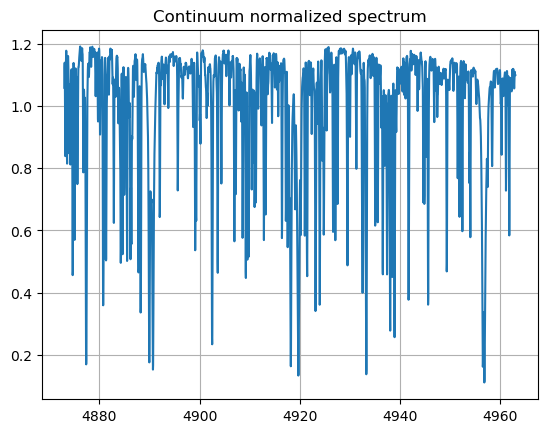

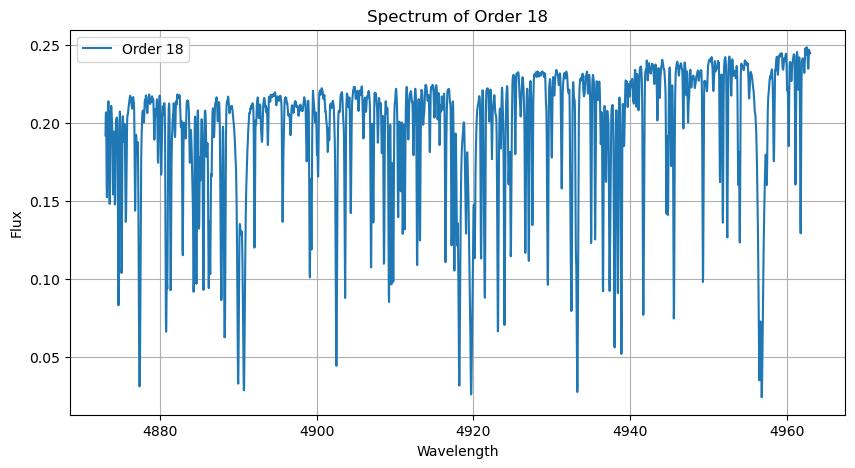

(3000,)
Order 19 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_19.dat


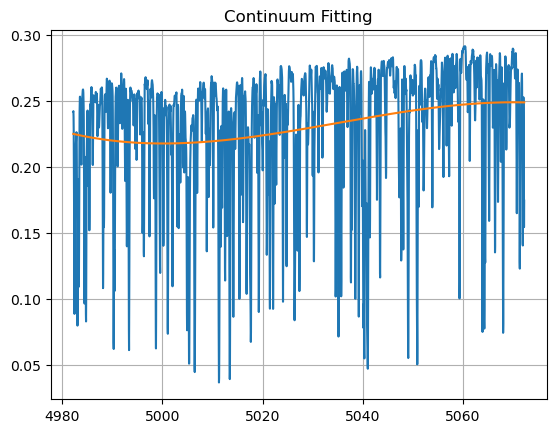

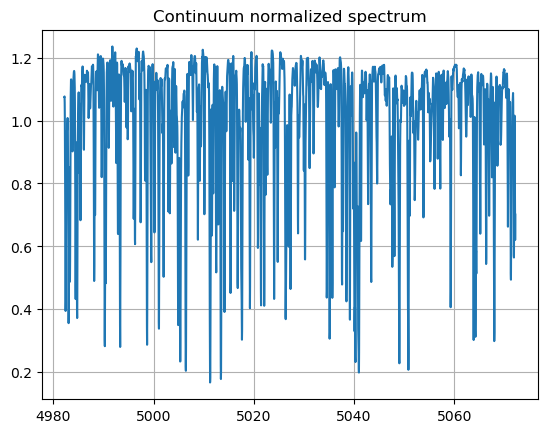

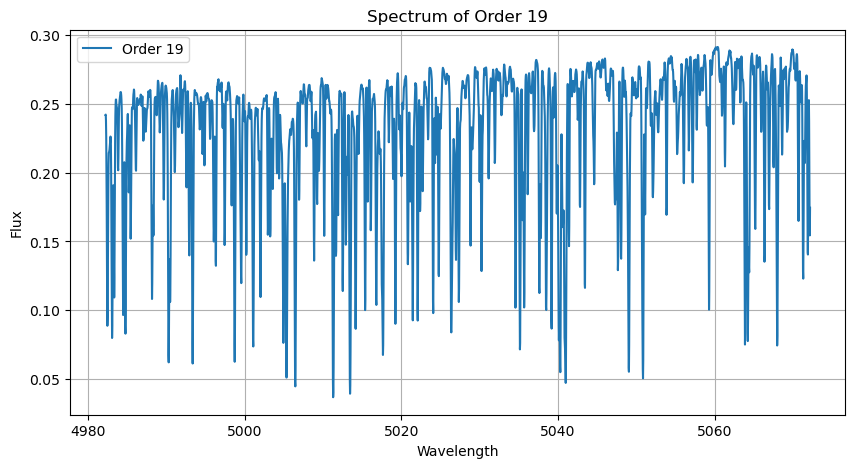

(3000,)
Order 20 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_20.dat


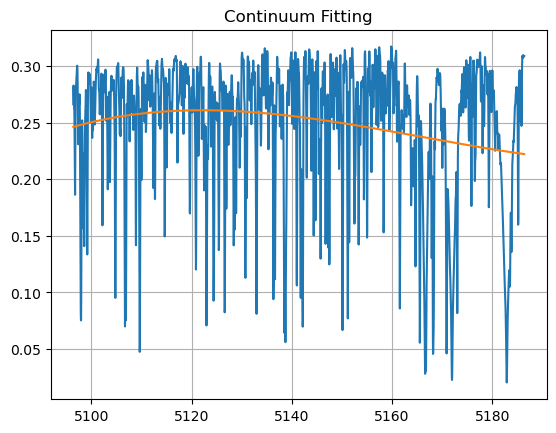

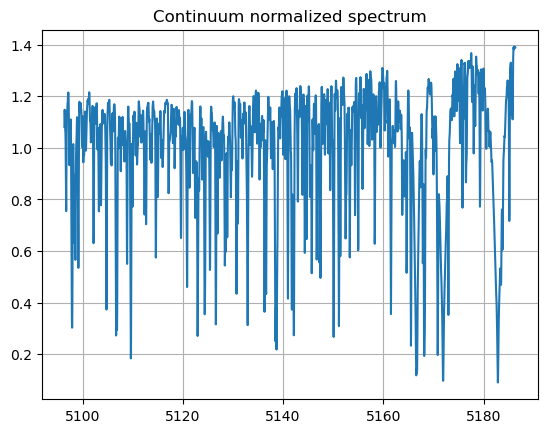

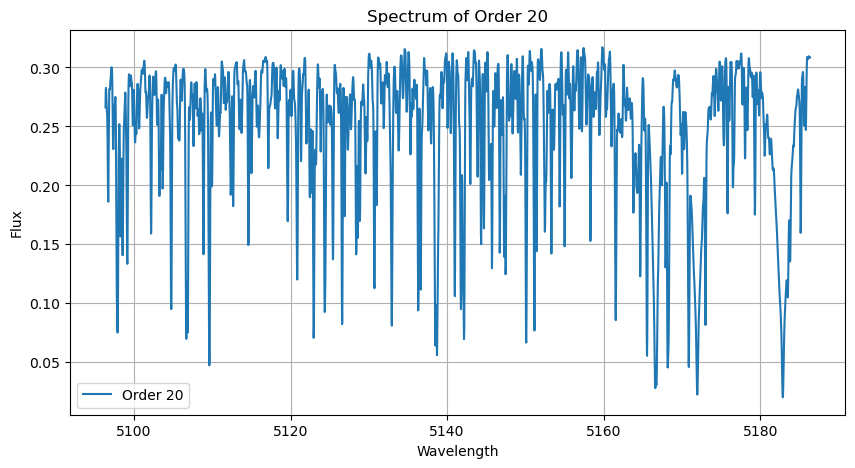

(3000,)
Order 21 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_21.dat


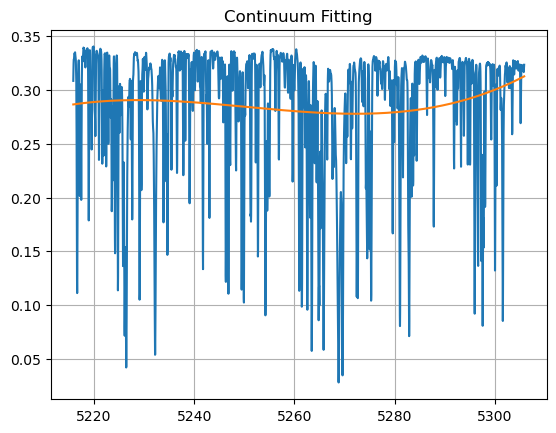

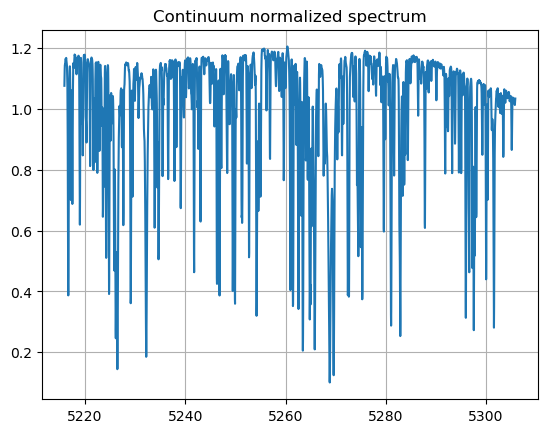

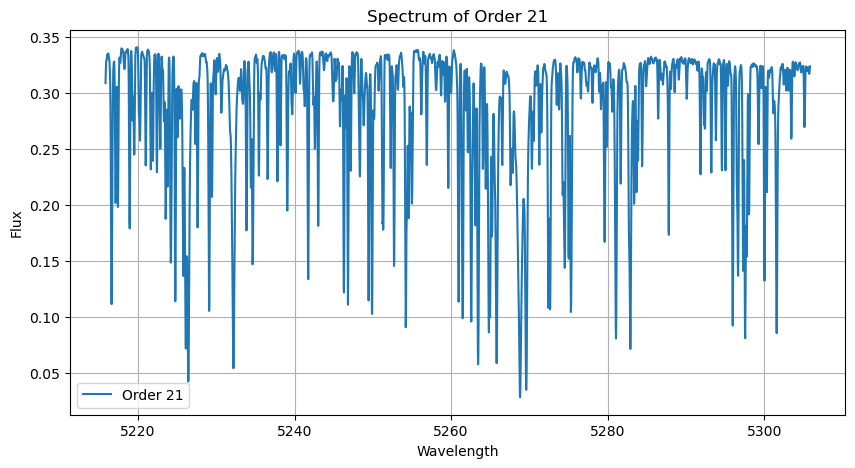

(3000,)
Order 22 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_22.dat


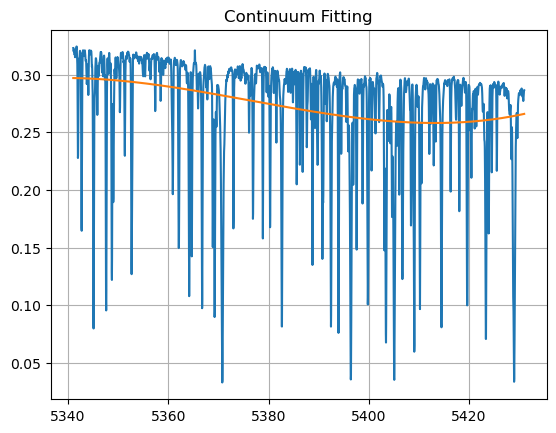

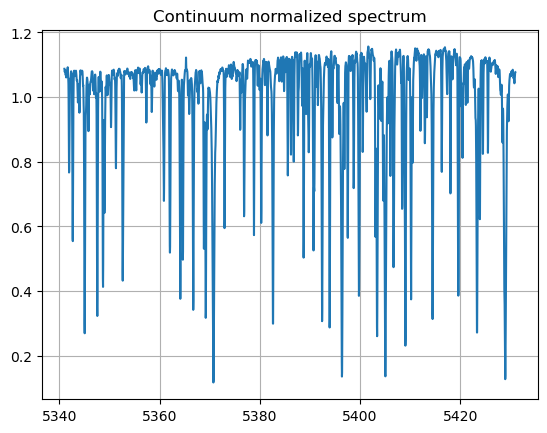

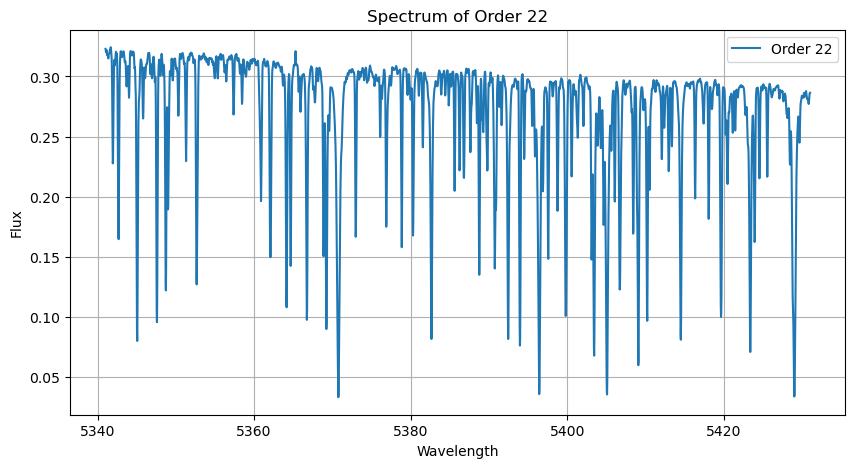

(3000,)
Order 23 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_23.dat


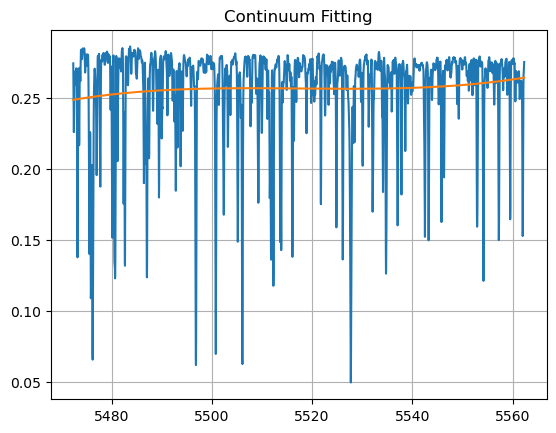

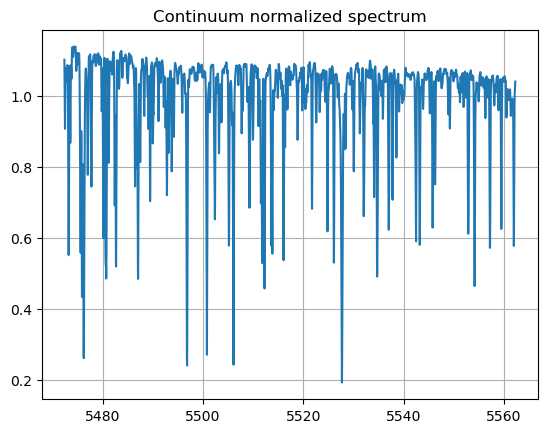

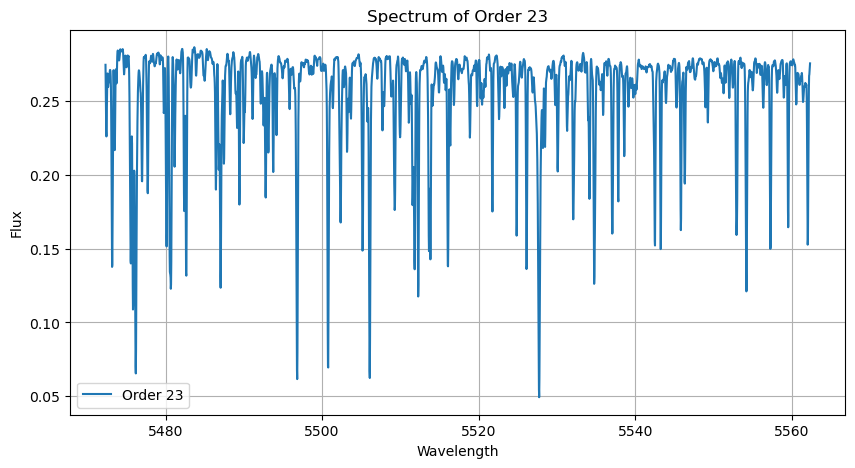

(3000,)
Order 24 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_24.dat


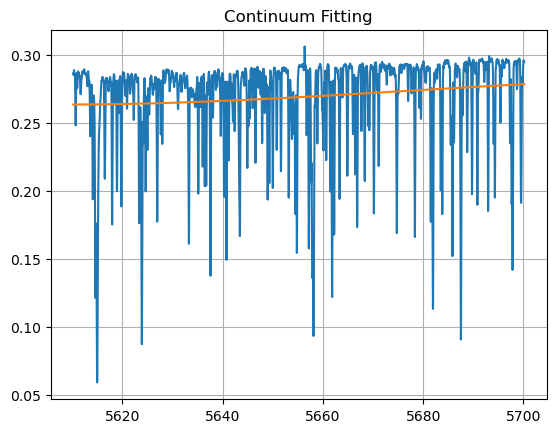

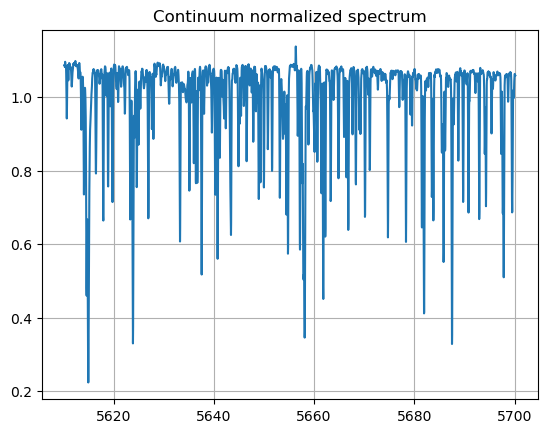

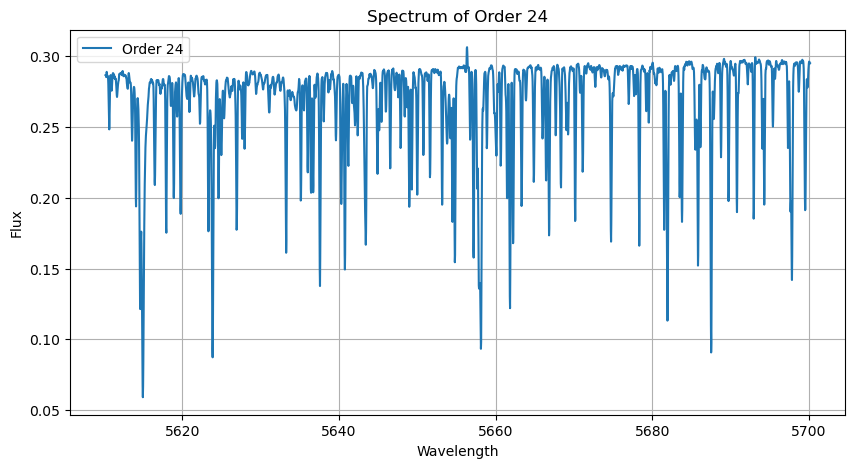

(3000,)
Order 25 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_25.dat


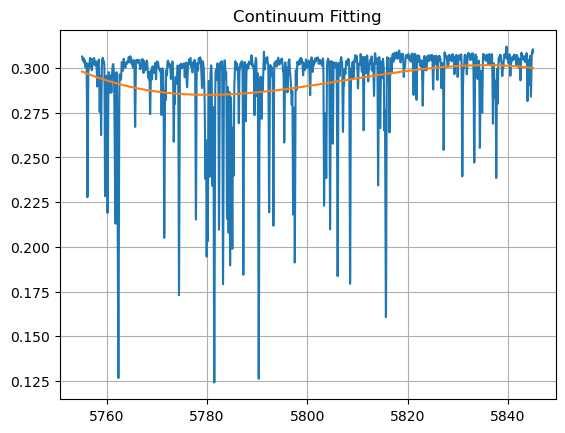

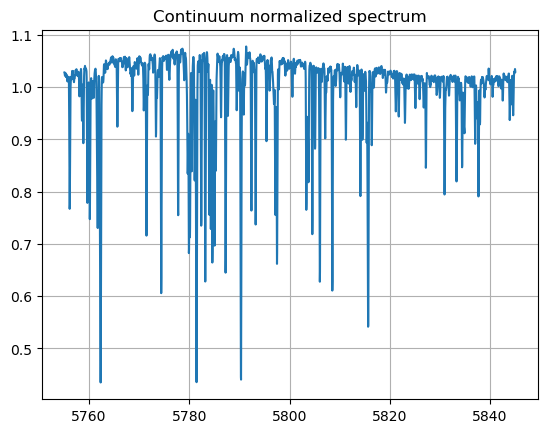

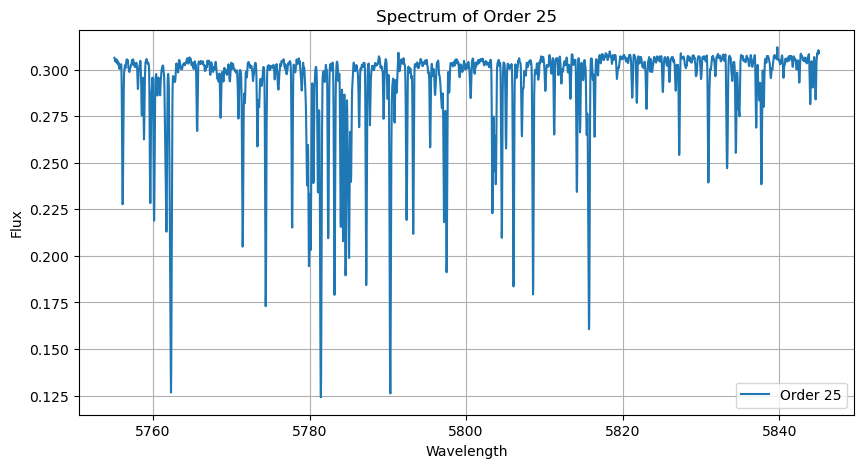

(3000,)
Order 26 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_26.dat


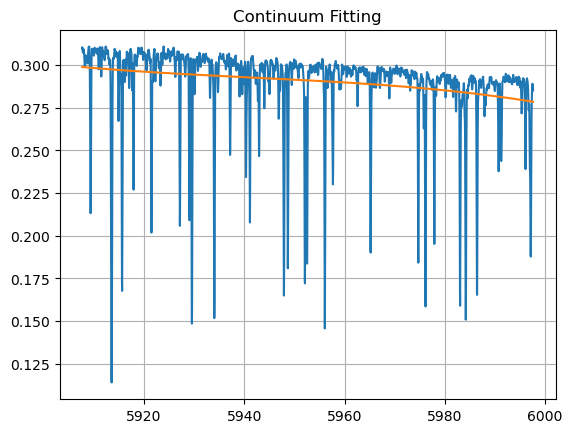

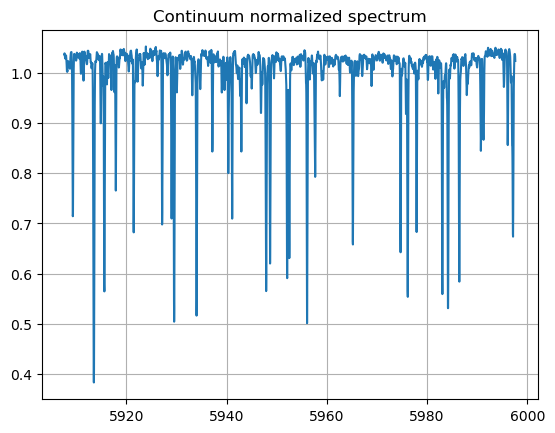

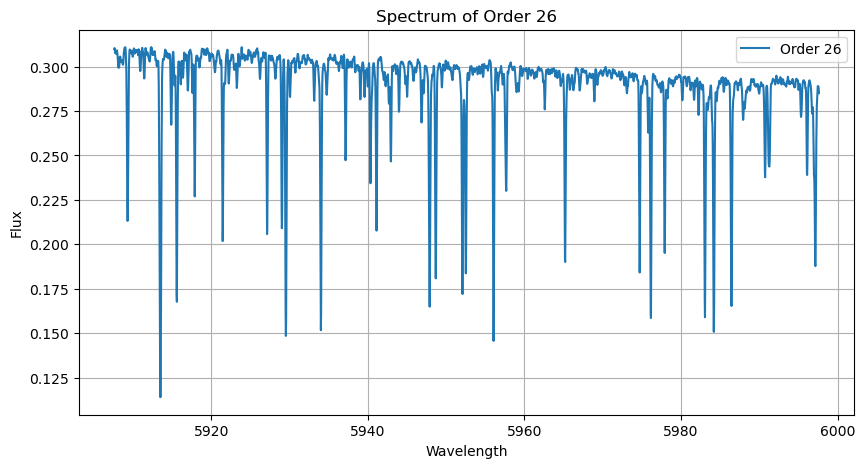

(3000,)
Order 27 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/order_27.dat


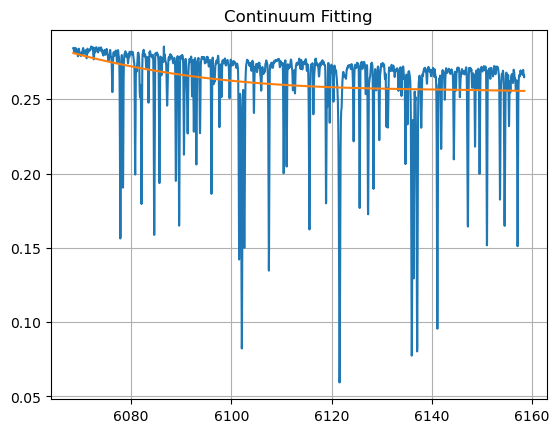

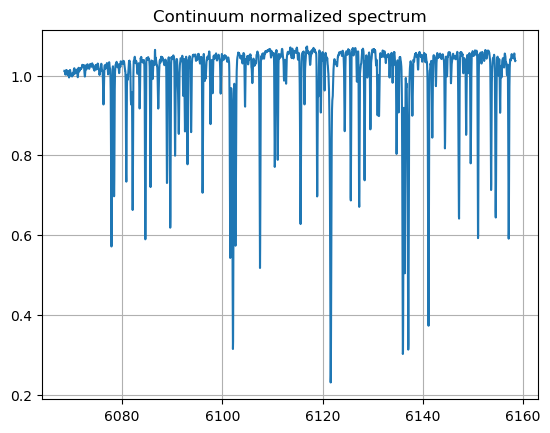

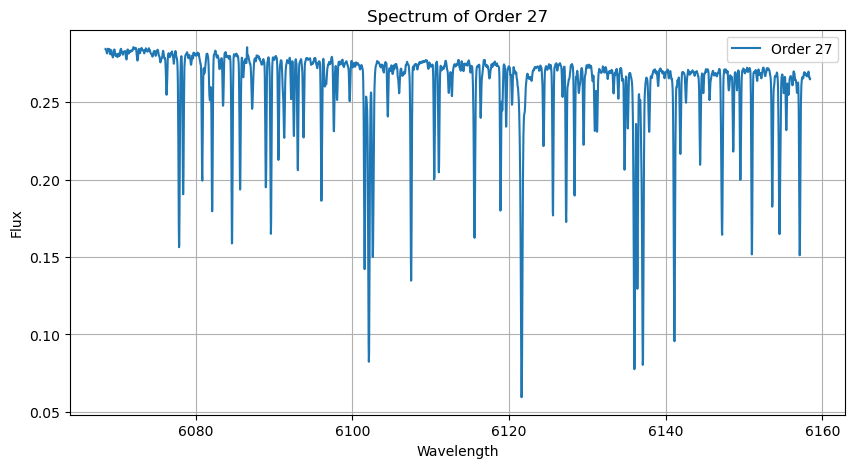

All orders saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/r.FEROS.2012-05-12T01:51:55.995.3081_all_orders.dat
Processing file: /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/r.FEROS.2007-04-01T03:53:00.804.3081.fits


XTENSION= 'IMAGE   '           / FITS Image Extension                           
BITPIX  =                  -32 / No. of bits per pixel                          
NAXIS   =                    1 / No. of axes in image                           
NAXIS1  =                 4462 / No. of pixels                                  
PCOUNT  =                    0 / Parameter count always 0                       
GCOUNT  =                    1 / Group count always 1                           
                                                                                
CRPIX1  =                 -49. / Reference pixel                                
CRVAL1  =              3525.87 / Coordinate at reference pixel                  
CDELT1  =                 0.03 / Coord. incr. per pixel (original value)        
CTYPE1  = 'WAVELENGTH      '   / Units of coordinate                            
BUNIT   = 'FLUX            '   / Units of data values                           
DATAMAX =       0.1913912594

(3000,)
Order 5 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_5.dat


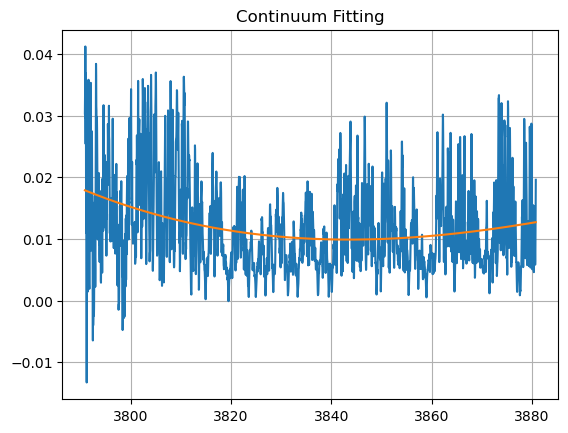

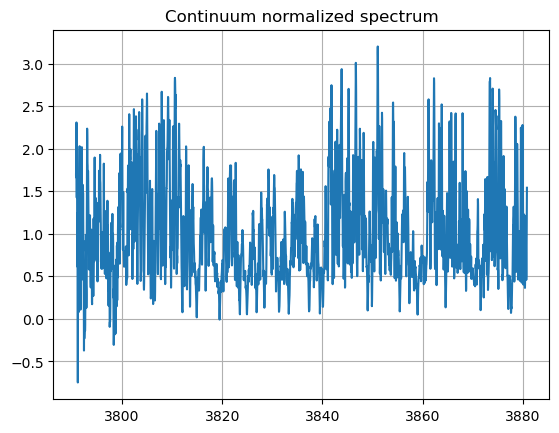

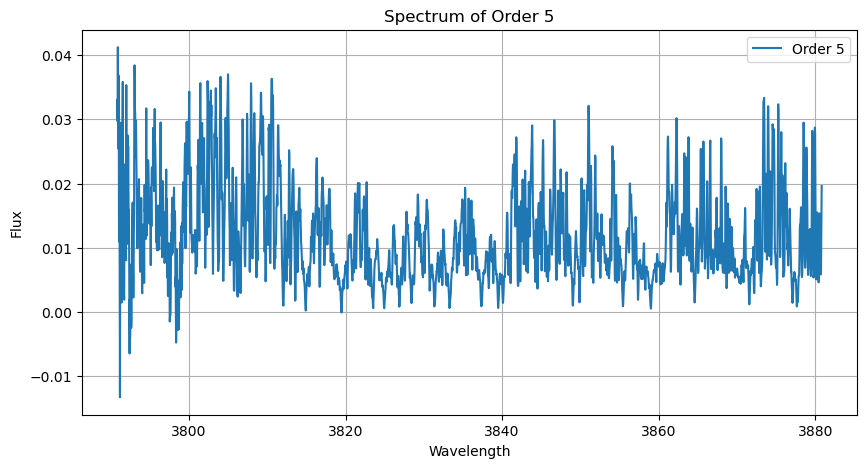

(3000,)
Order 6 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_6.dat


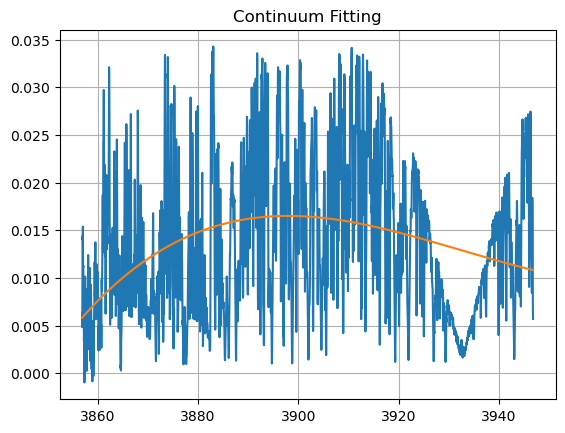

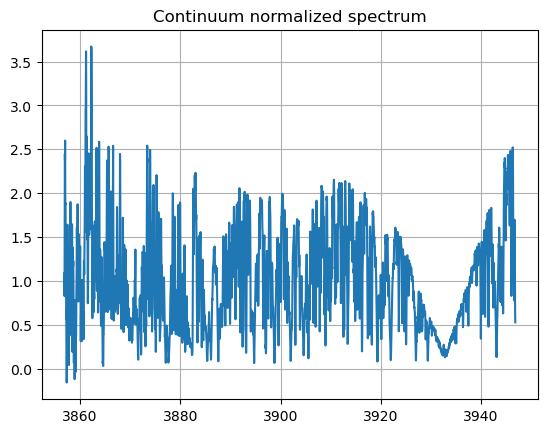

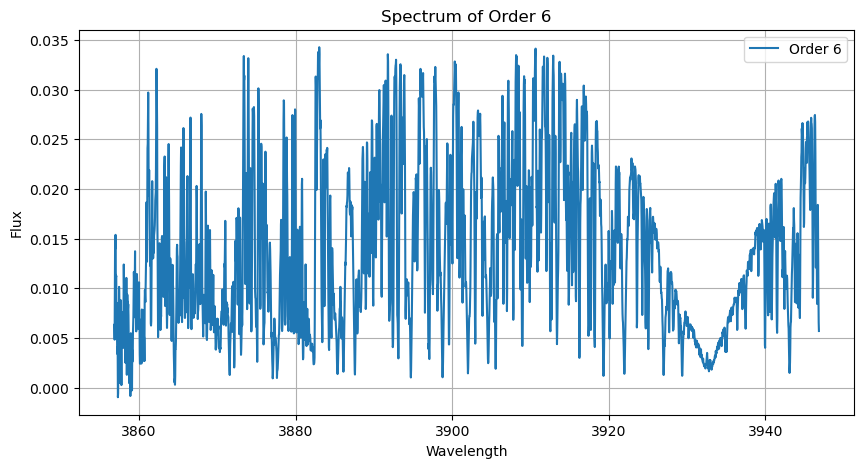

(3000,)
Order 7 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_7.dat


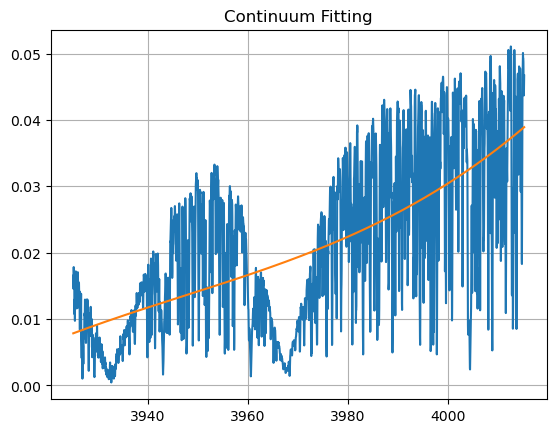

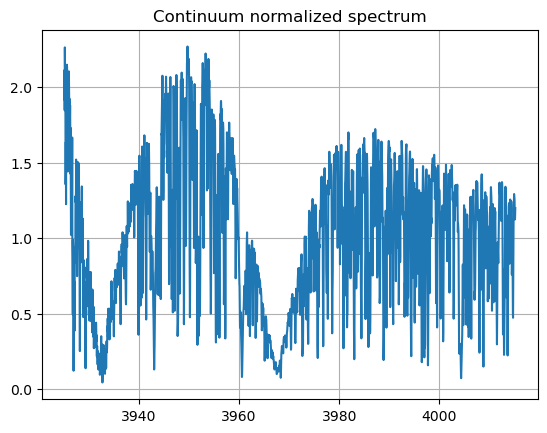

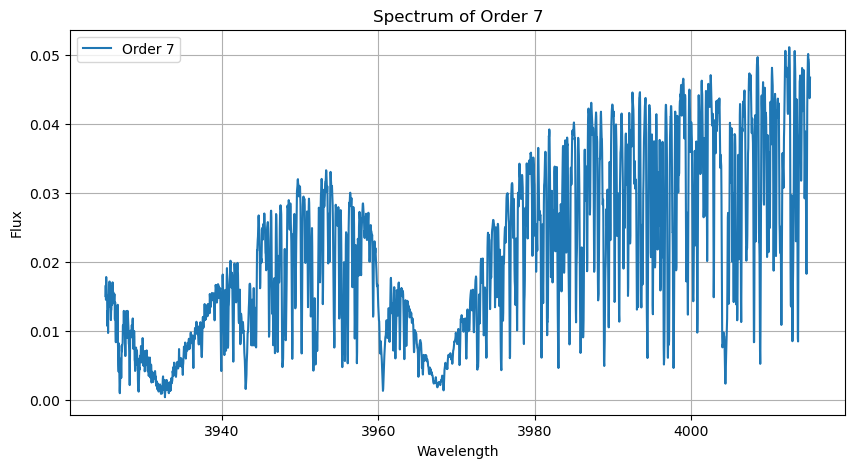

(3000,)
Order 8 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_8.dat


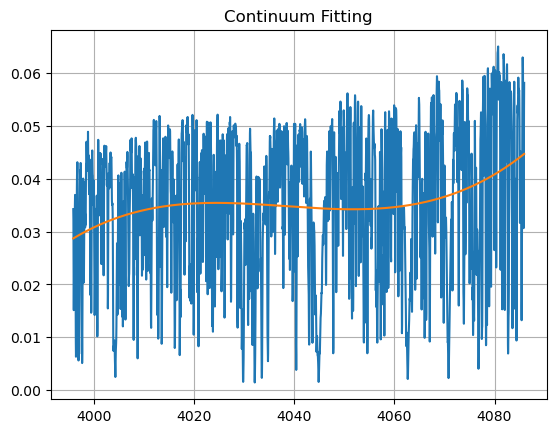

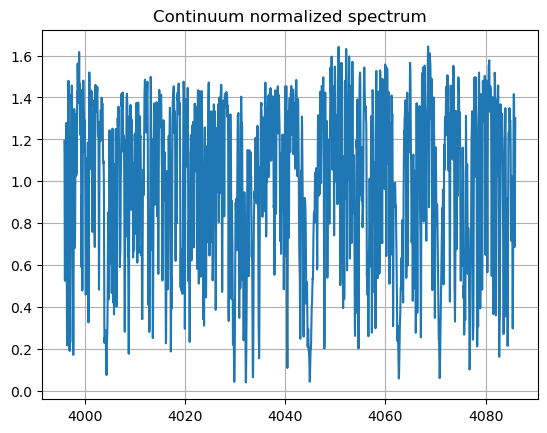

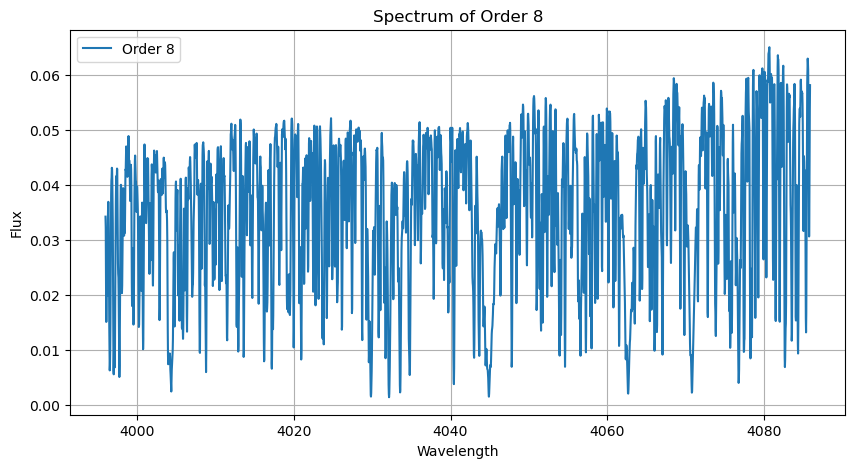

(3000,)
Order 9 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_9.dat


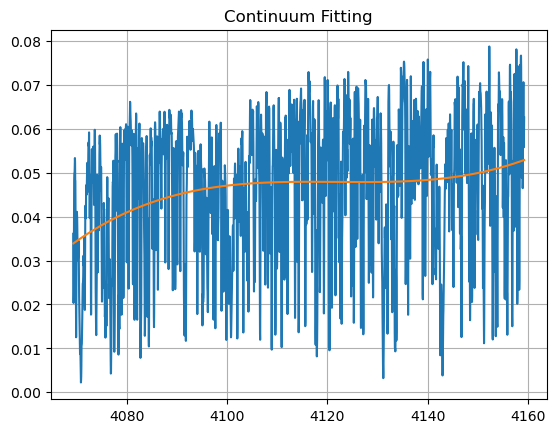

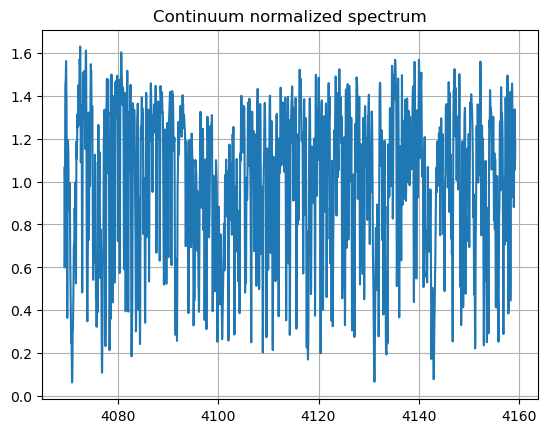

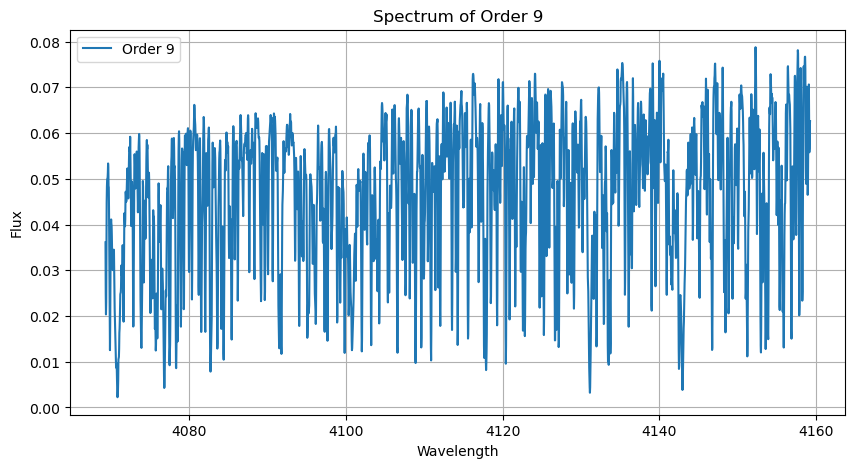

(3000,)
Order 10 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_10.dat


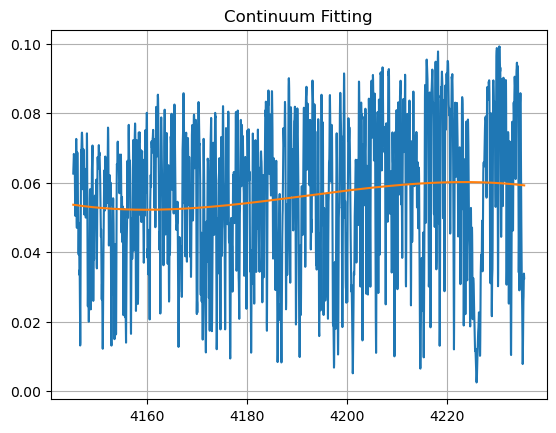

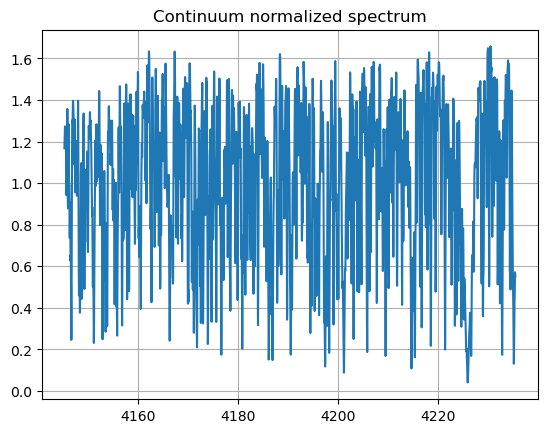

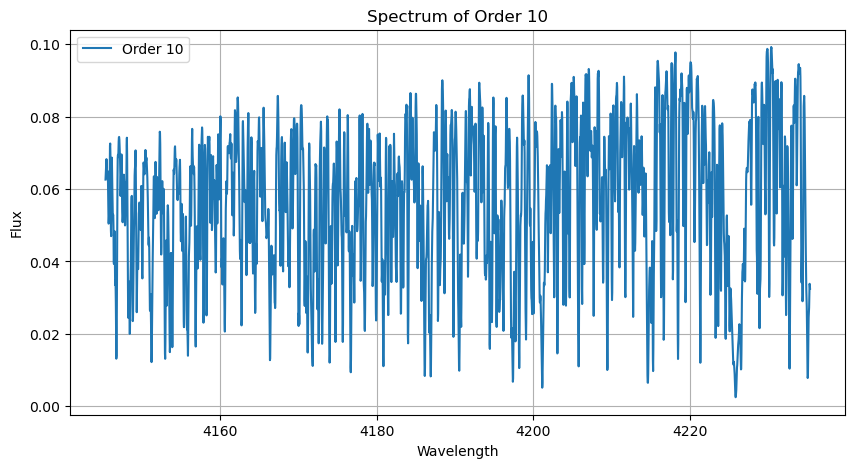

(3000,)
Order 11 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_11.dat


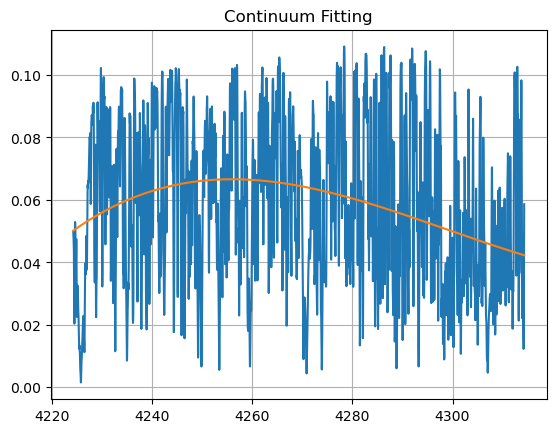

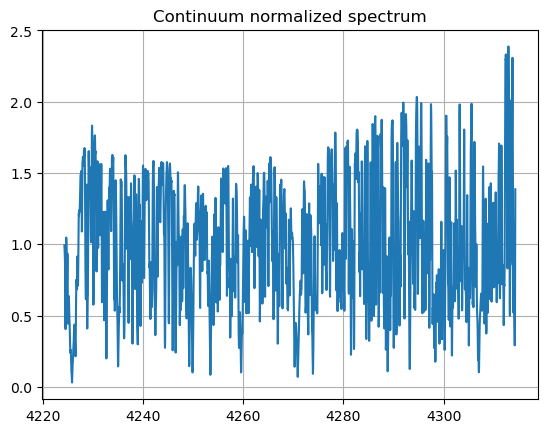

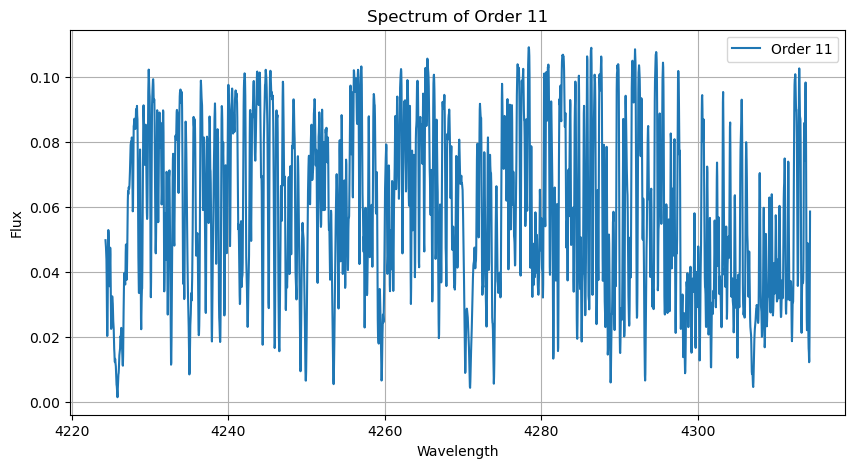

(3000,)
Order 12 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_12.dat


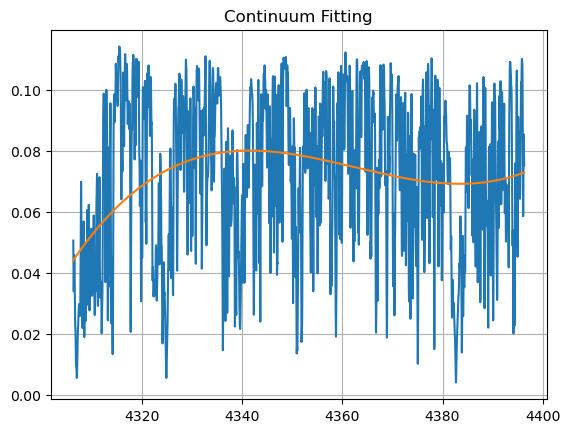

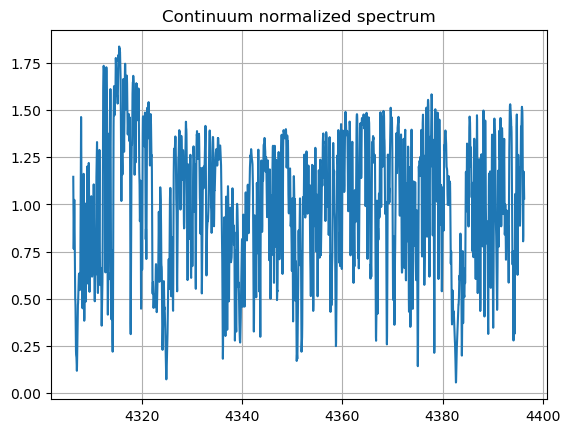

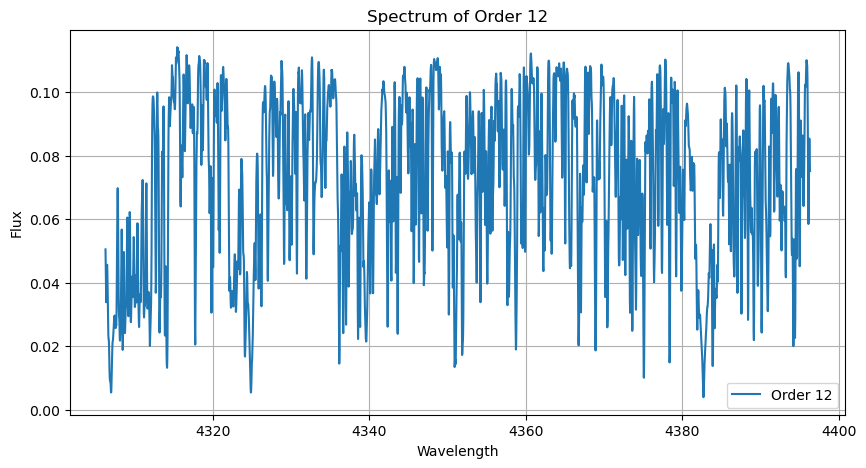

(3000,)
Order 13 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_13.dat


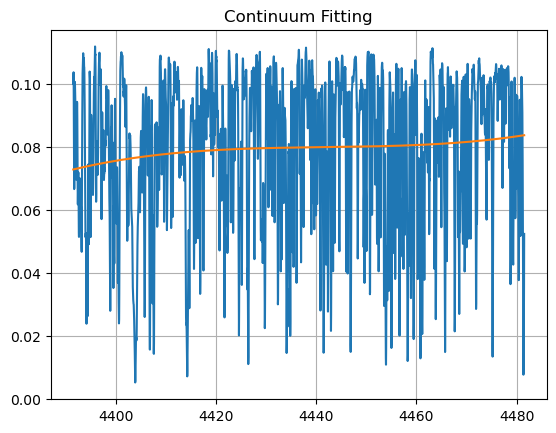

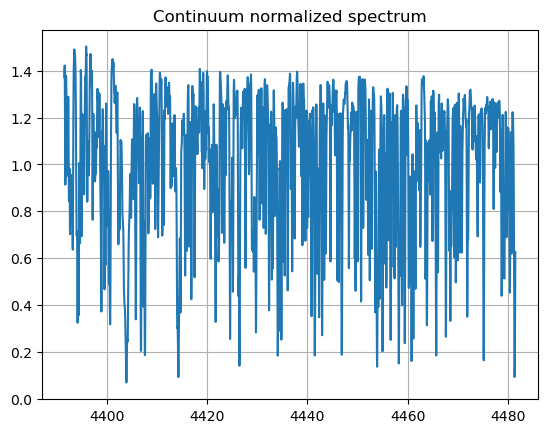

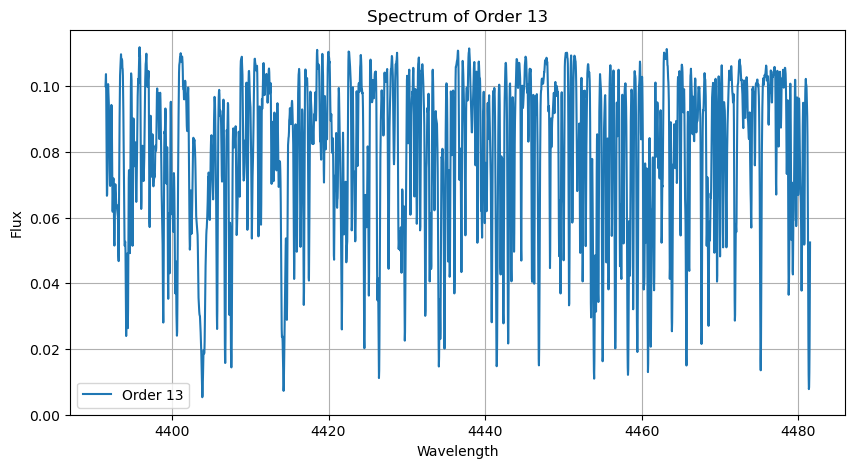

(3000,)
Order 14 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_14.dat


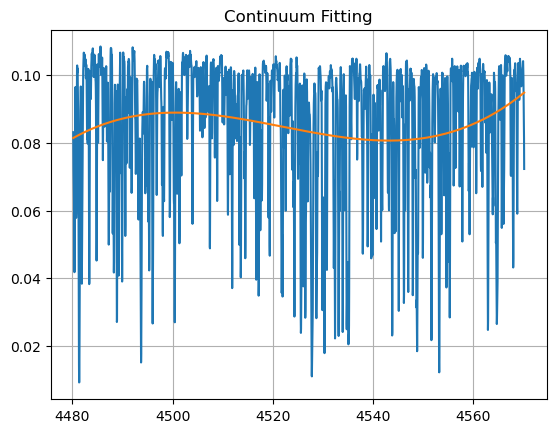

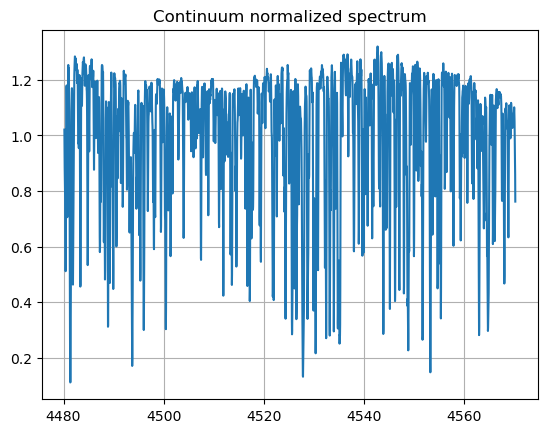

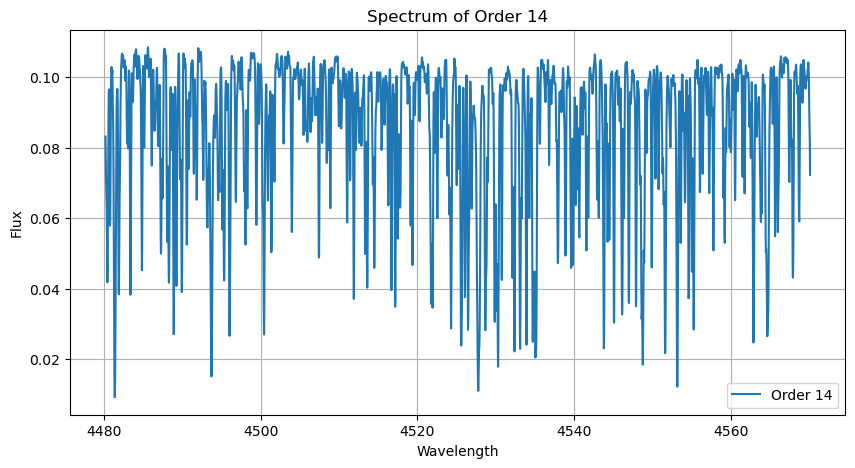

(3000,)
Order 15 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_15.dat


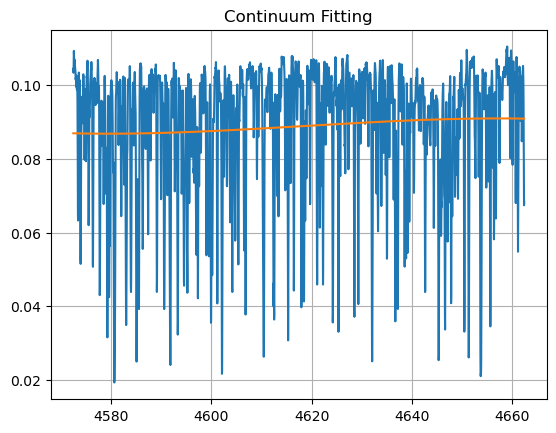

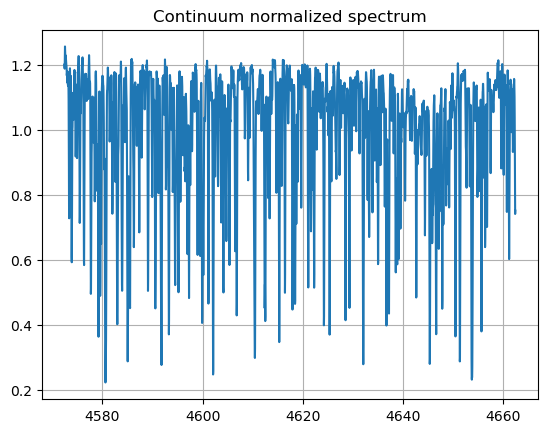

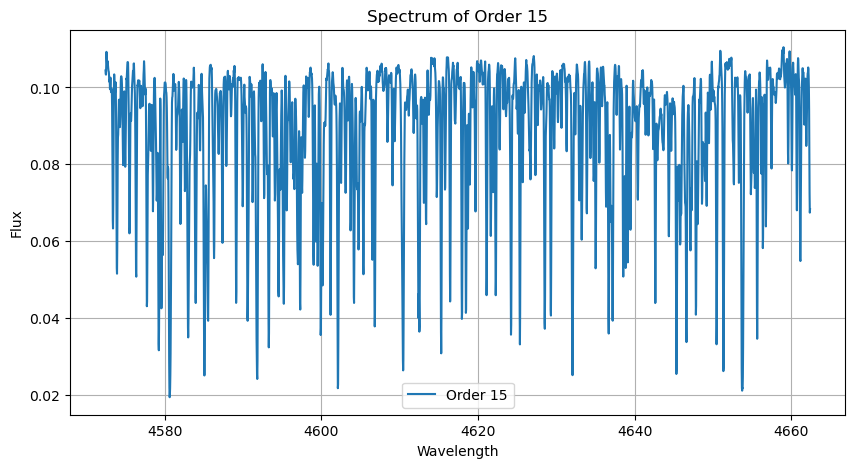

(3000,)
Order 16 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_16.dat


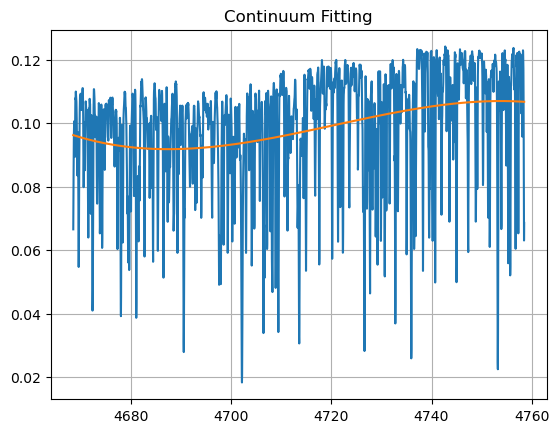

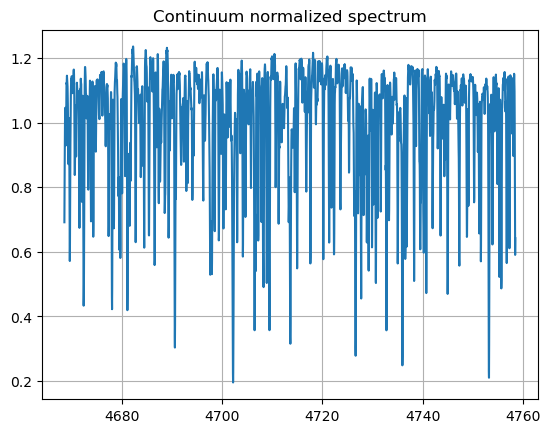

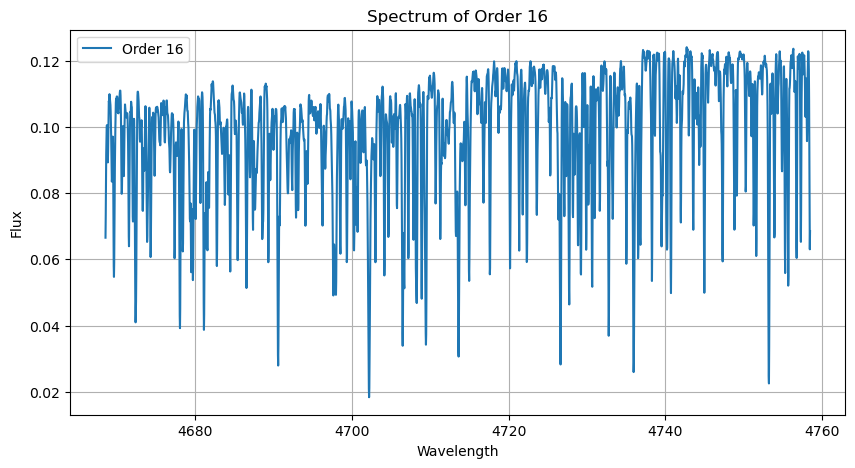

(3000,)
Order 17 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_17.dat


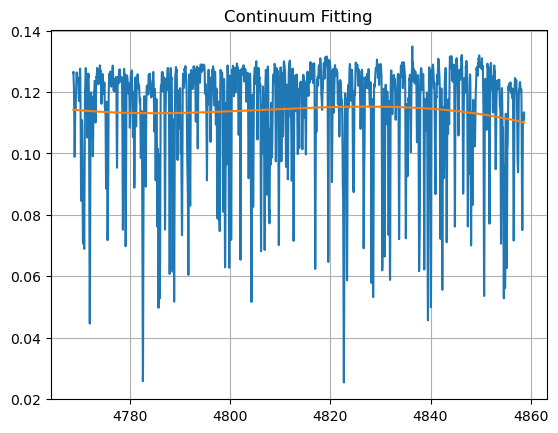

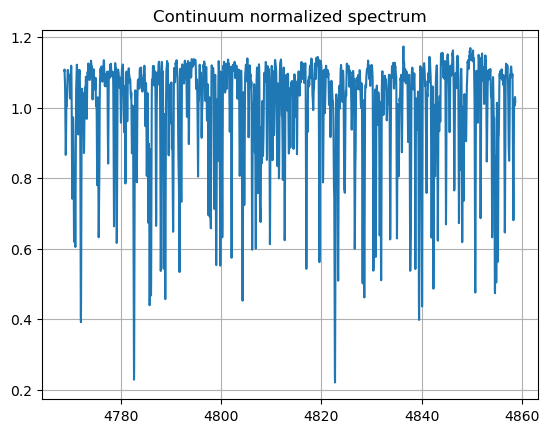

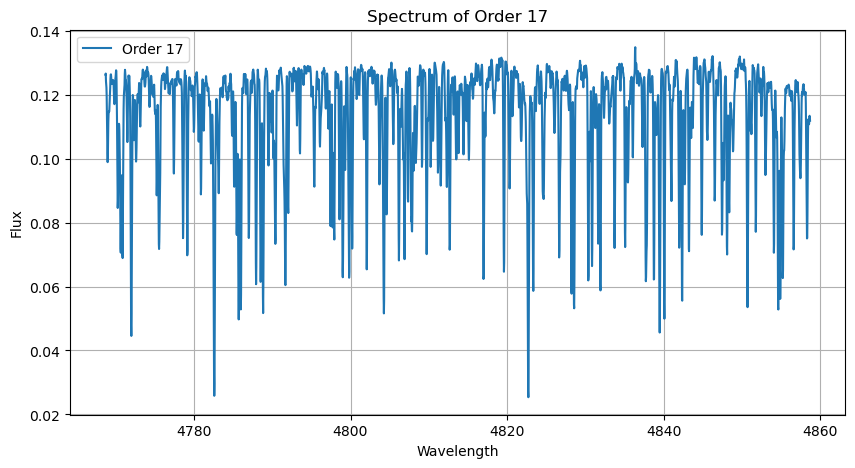

(3000,)
Order 18 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_18.dat


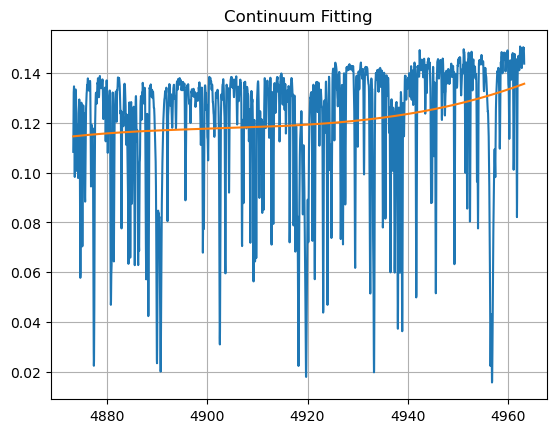

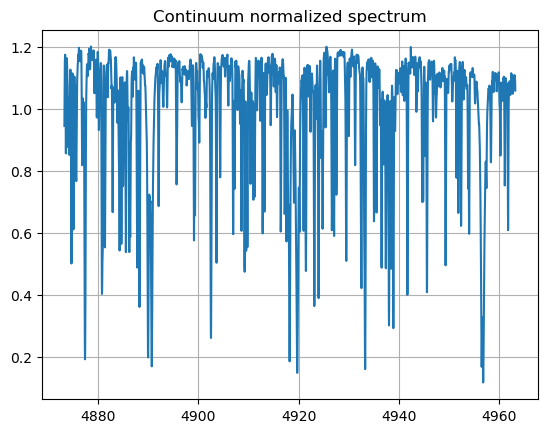

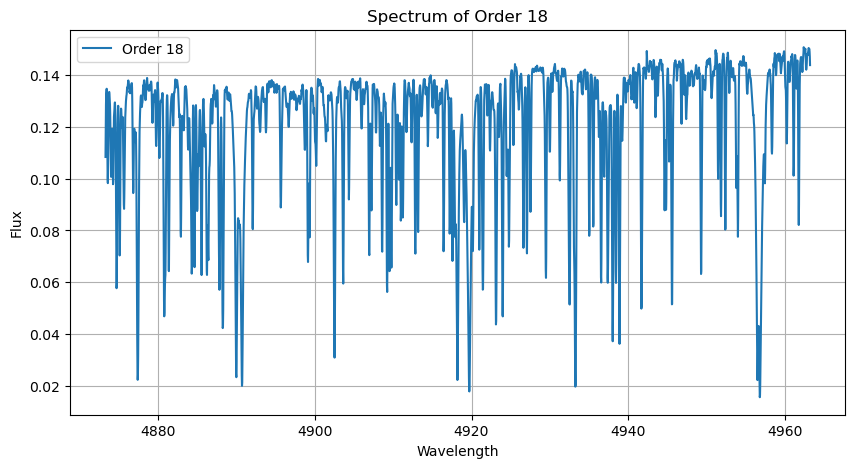

(3000,)
Order 19 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_19.dat


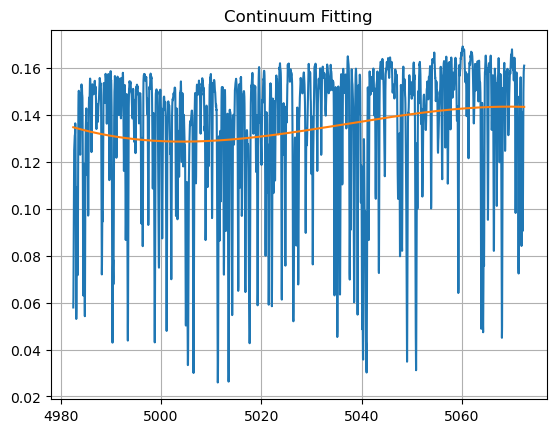

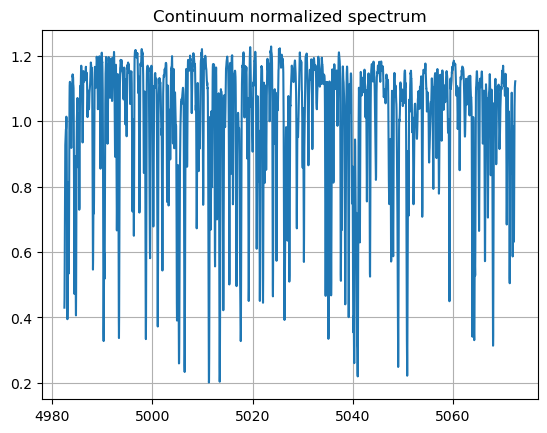

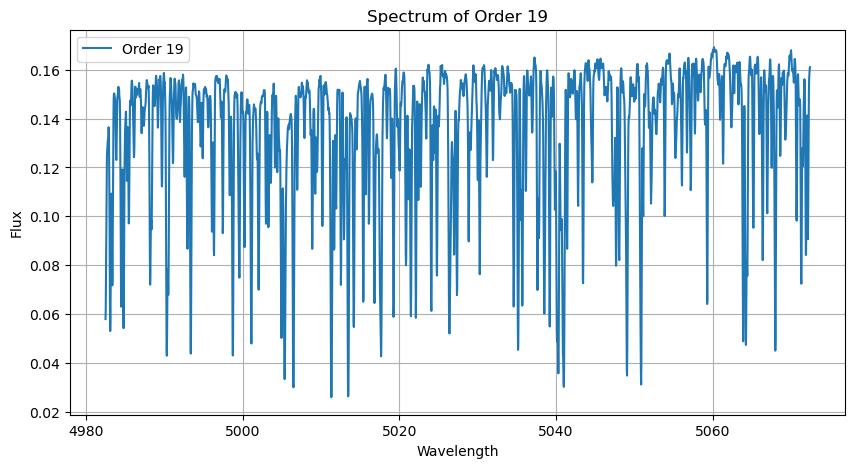

(3000,)
Order 20 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_20.dat


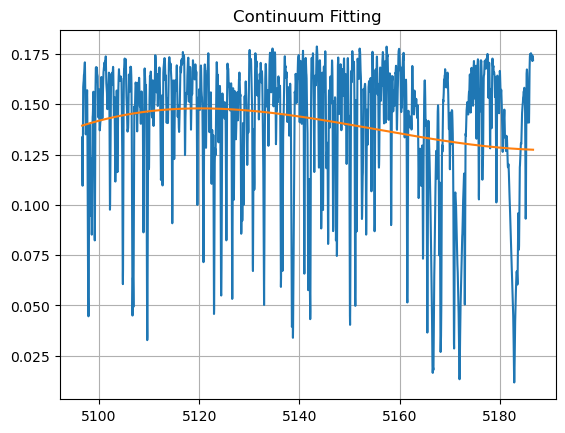

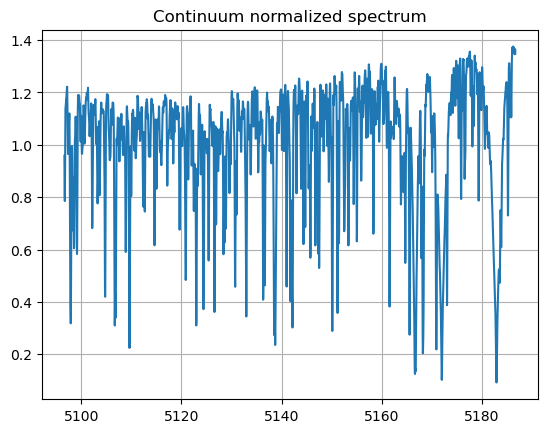

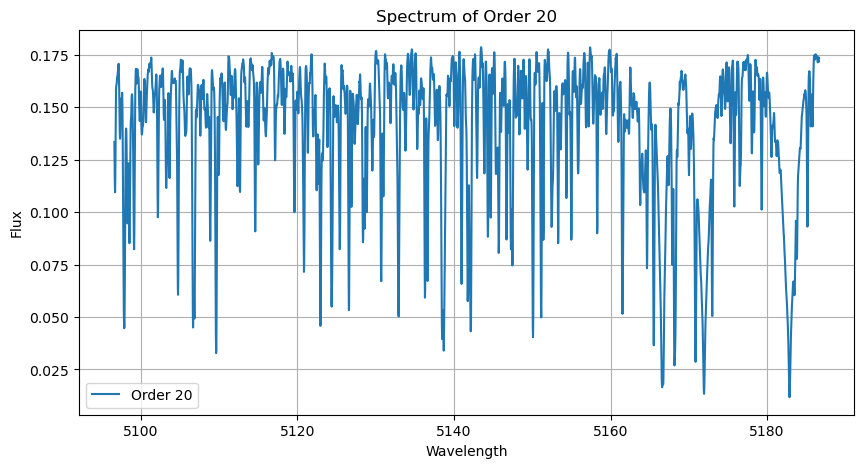

(3000,)
Order 21 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_21.dat


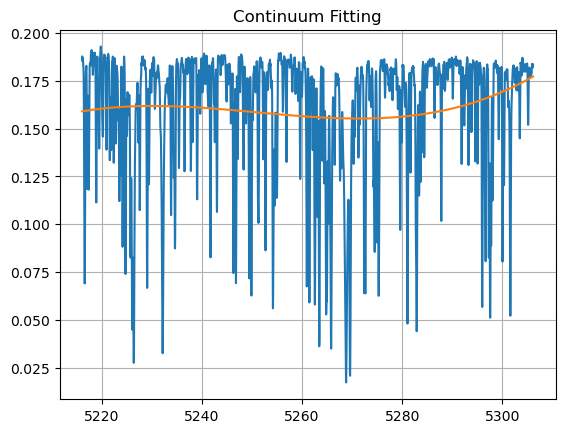

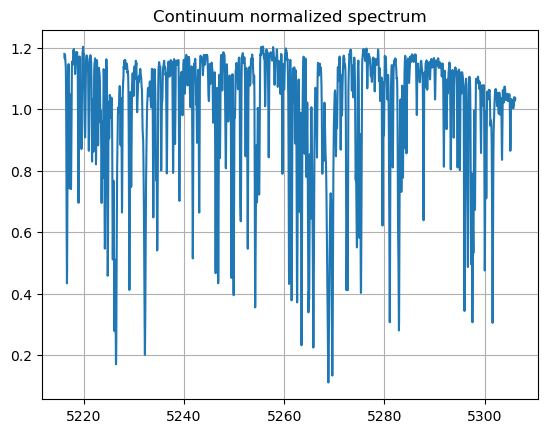

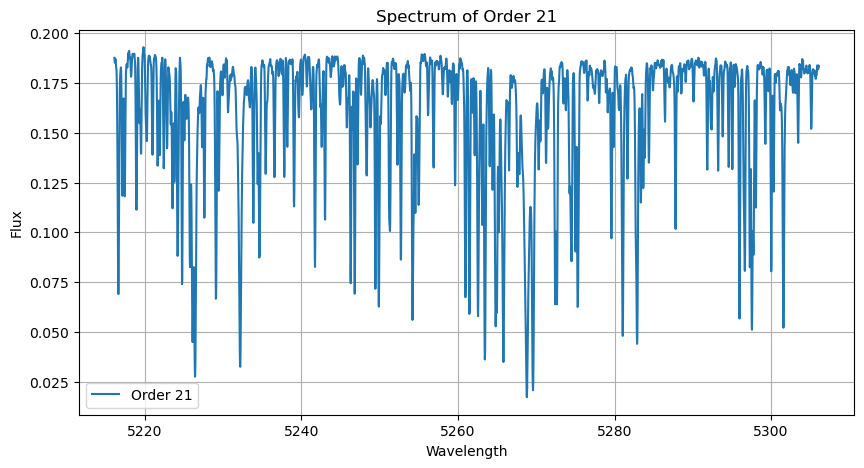

(3000,)
Order 22 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_22.dat


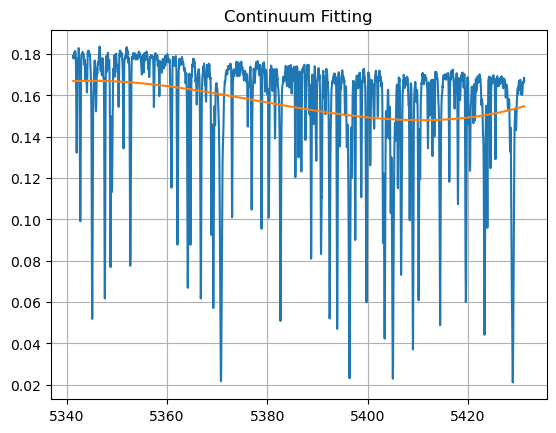

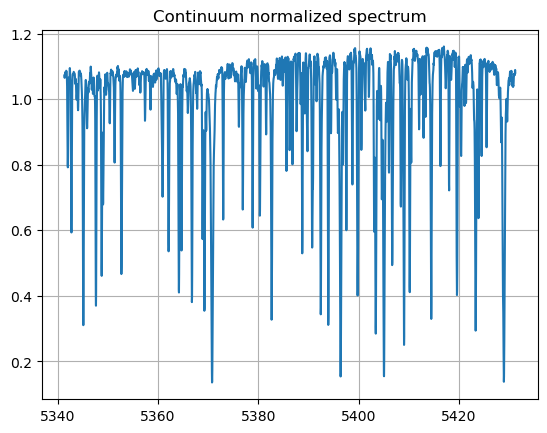

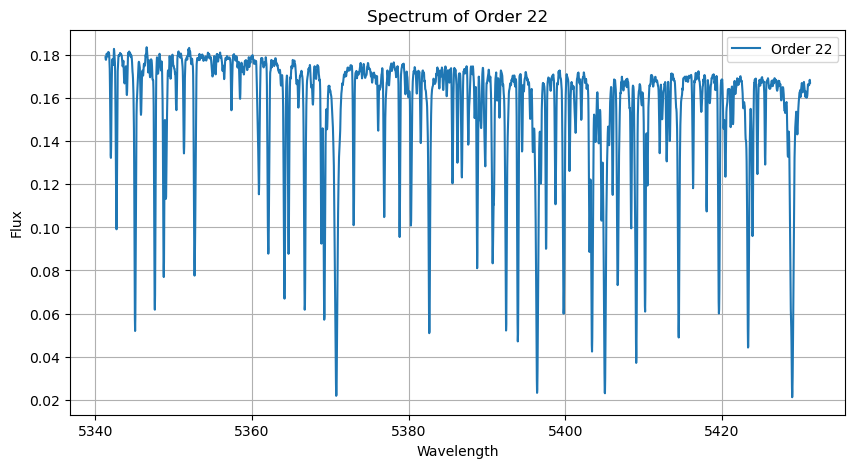

(3000,)
Order 23 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_23.dat


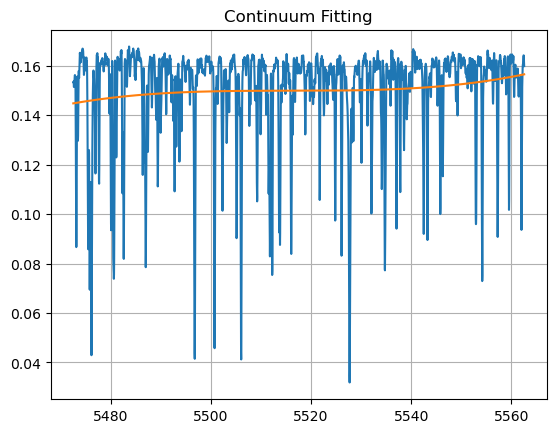

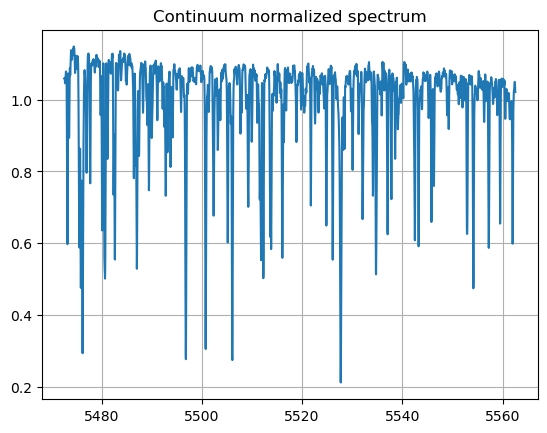

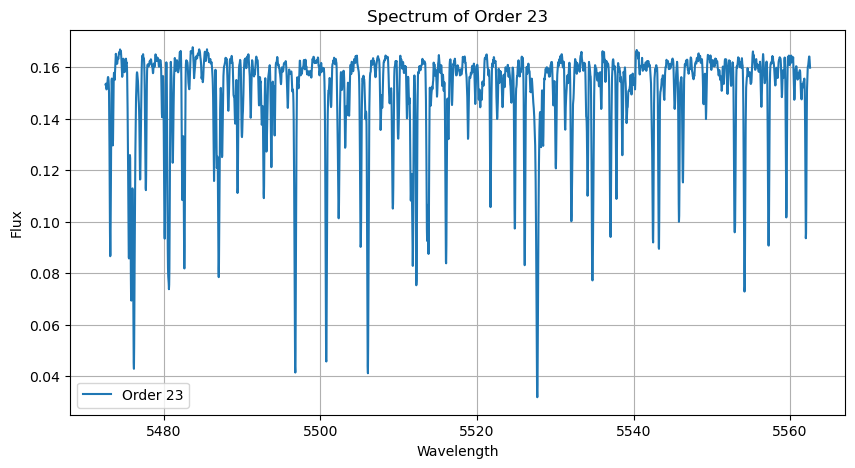

(3000,)
Order 24 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_24.dat


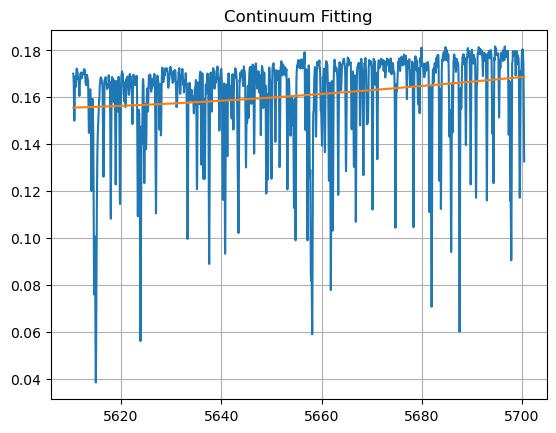

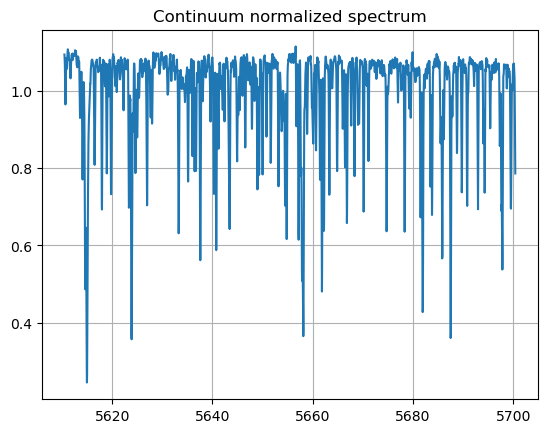

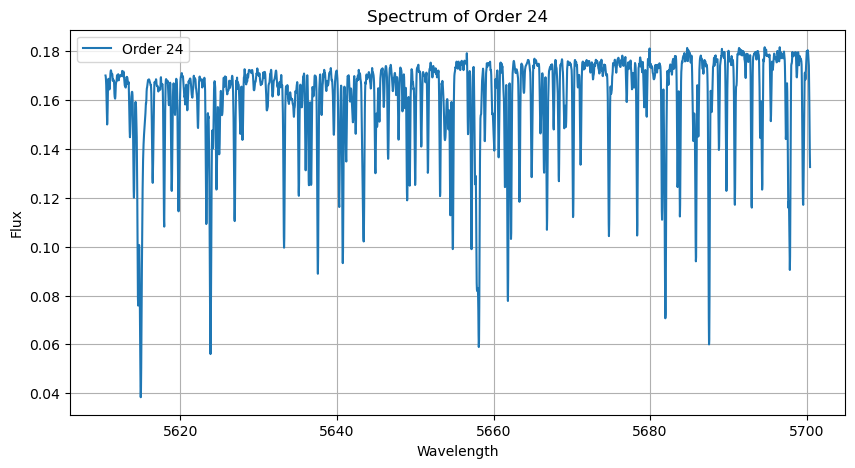

(3000,)
Order 25 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_25.dat


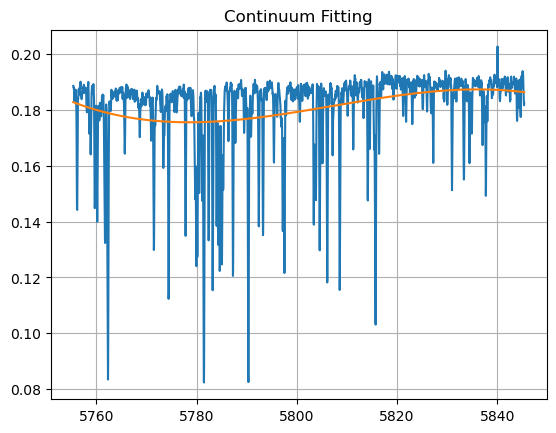

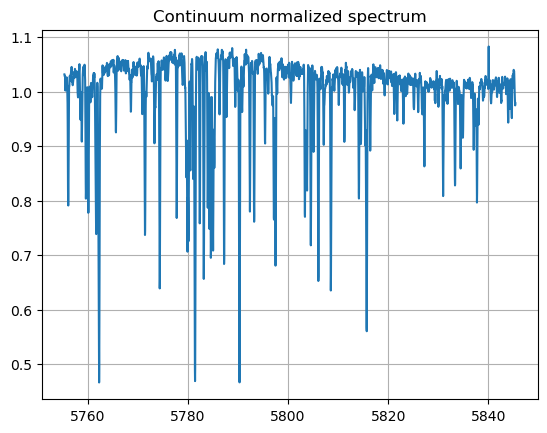

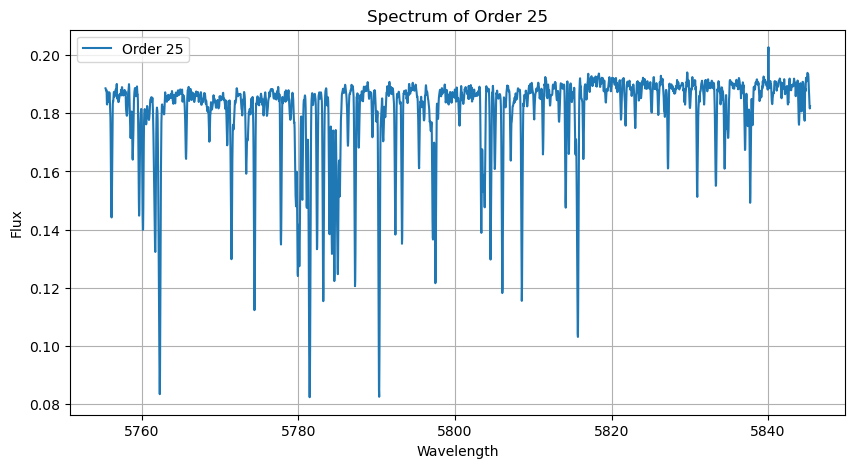

(3000,)
Order 26 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_26.dat


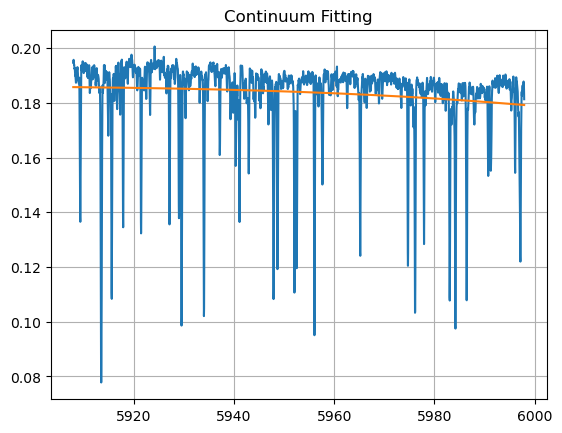

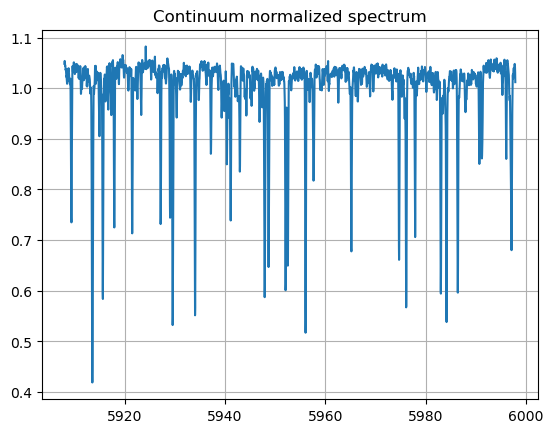

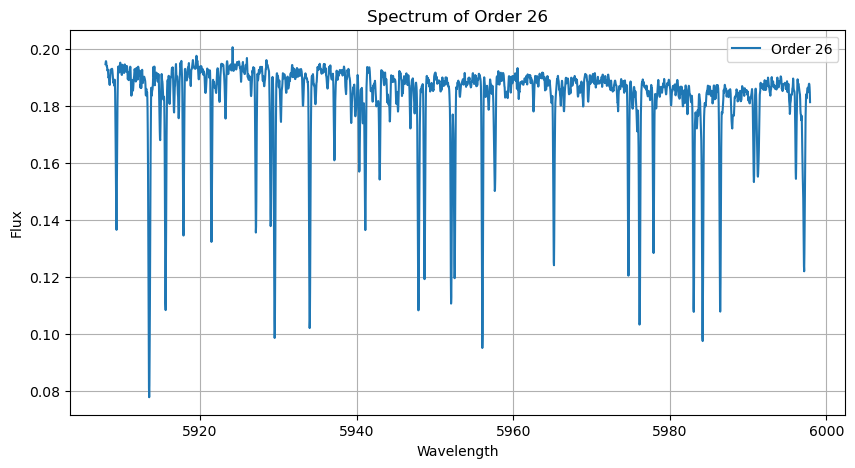

(3000,)
Order 27 saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/order_27.dat


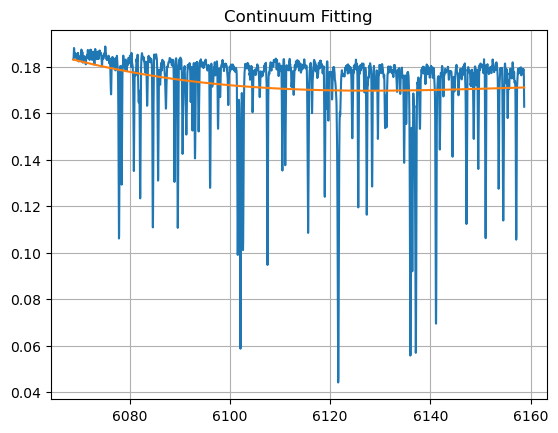

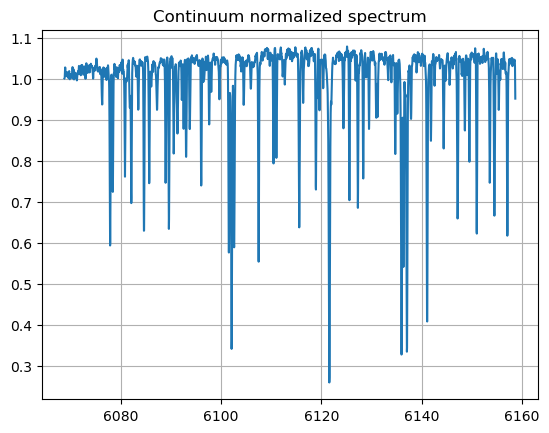

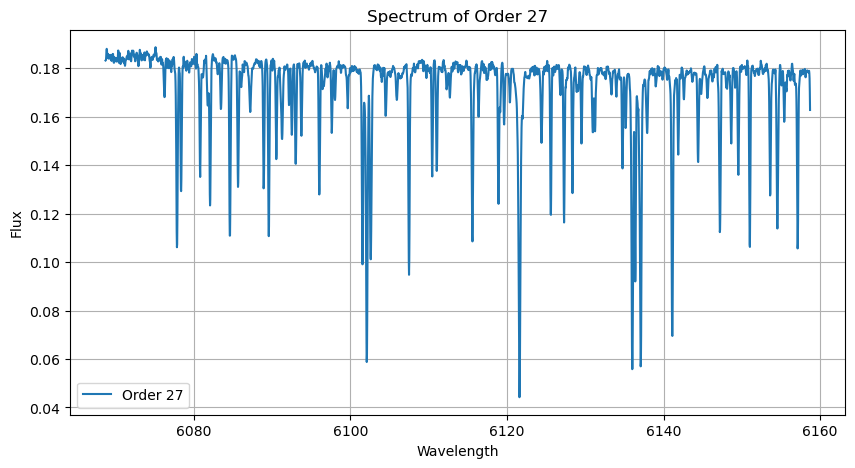

All orders saved to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/r.FEROS.2007-04-01T03:53:00.804.3081_all_orders.dat
Copied /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-21T11:56:33.468/orders/r.FEROS.2006-06-19T22:43:12.651.3081_all_orders.dat to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/feros/HD 92588/r.FEROS.2006-06-19T22:43:12.651.3081_all_orders.dat
Copied /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-27T07:02:45.094/orders/r.FEROS.2012-05-12T01:51:55.995.3081_all_orders.dat to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/feros/HD 92588/r.FEROS.2012-05-12T01:51:55.995.3081_all_orders.dat
Copied /Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/HD 92588/ADP.2016-09-22T12:25:28.932/orders/r.FEROS.2007-04-01T03:53:00.804.3081_all_orders.dat to /Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC202

In [63]:


target_name = 'HD 92588'

folder_path = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}/'
process_folder(folder_path)
# 设置源文件夹和目标文件夹路径
target_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/feros/{target_name}'
source_base_folder = f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/FEROS/Spectra/{target_name}'

# copy orders
copy_all_orders_files(source_base_folder, target_folder)
# copy fits
target_fits_folder =f'/Users/noground/Desktop/ABDEC rv/ABDEC_2024/ABDEC2024-WASP189-216HRS-demo/barycorr/{target_name}'
copy_all_fits_files(source_base_folder, target_fits_folder)